<a href="https://colab.research.google.com/github/RajarshiRay25/FINLAND---Network-Pharmacology-Pipelines-and-Methodologies/blob/main/FINLAND_Network_Pharmacology_CRS_and_COVID_File_Preparation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## PYTHON SCRIPT WORKFLOW DETAILS

 * Only take the Phenotype Name and Involved Genes - Raw File from CTD Unprocessed
 * When downloading the files from CTD only keep the parameter and gene column. Remove other before uploading in this notebook.
 * Using delimeter in the genes column separate them and use pandas explode to convert into separate data
 * Upload the common gene csv file single column with common genes between CRS and COVID
 * Use INNER JOIN to to match and combine genes with respect to phenotypes or chemicals or pathways
 * Obtain the final merged file
 * Count the phenotypes/chemicals/pathways associated with each gene and display it.Genes with max counts be selected for further analysis.
 * For having a more detailed data with supportive proofs include other chemicals/pathways/phenotypes which may have less genes but related to the study.
 * Create a JACCARD INDEX Map to visualise the quantity of chemicals/phenotypes/pathways to obtain gene pairs which are most involved.
 * Create hierarchy maps using dendograms on the Jaccard Data to observe clusters.
 * Using NetworkX Library to build complex biological networks among the generated parameters.

In [ ]:
# Pandas import

import pandas as pd

## STEP 1 : Processing the Phenotype File with respect to similar gene list file.


In [ ]:
# Obtain the common genes between CRS and COVID with VENNY and upload that csv file

common_genes_df = pd.read_csv('./common genes.csv')

common_genes_df.head()


,gene names
0,CD69
1,IL2
2,COA4
3,NKIRAS2
4,MIR185


In [ ]:
import pandas as pd

# Read the CSV file of the raw phenotype file obtained from CTD database

df = pd.read_csv('./covid phenoptypes raw.csv')

# Remove blank data

df.dropna(inplace=True)
df.columns

Index(['Phenotype Term Name', 'Gene Inference Network'], dtype='object')

In [ ]:
df.shape

(1263, 2)

In [ ]:
# Split genes into a list for further preprocessing

df['Gene Inference Network'] = df['Gene Inference Network'].str.split('|')

# Explode the genes into separate rows with pandas to have a simpler dataframe

df = df.explode('Gene Inference Network').reset_index(drop=True)

# Display the reformatted DataFrame

print(df)

                                    Phenotype Term Name Gene Inference Network
0                         cell population proliferation                    AGT
1                         cell population proliferation                   TYK2
2                                     apoptotic process                    BTK
3                                     apoptotic process                   IL1B
4                                     apoptotic process                  IL2RA
...                                                 ...                    ...
2205                           hepatocyte proliferation                    IL6
2206      regulation of actin cytoskeleton organization                    HCK
2207                glycosphingolipid metabolic process                   UGCG
2208  negative regulation of mononuclear cell prolif...                    CRP
2209              glucosylceramide biosynthetic process                   UGCG

[2210 rows x 2 columns]


In [ ]:
# Save the modified phenotype file into a csv for next use

df.to_csv('Phenotype_Modified.csv', index=False)

In [ ]:
# Merge Common genes with the phenotype genes using inner join to obtain common phenotype networks

merged_df = pd.merge(df, common_genes_df, left_on='Gene Inference Network', right_on='gene names', how='inner')

# Display the merged DataFrame

print(merged_df.columns)

Index(['Phenotype Term Name', 'Gene Inference Network', 'gene names'], dtype='object')


In [ ]:
# Drop the gene column from one table

merged_df.drop(['Gene Inference Network'],axis=1,inplace=True)

In [ ]:
merged_df.head()

,Phenotype Term Name,gene names
0,cell population proliferation,AGT
1,negative regulation of cell population prolife...,AGT
2,positive regulation of cell population prolife...,AGT
3,regulation of blood pressure,AGT
4,vasoconstriction,AGT


In [ ]:
# Obtain the csv for phenotype genes by similar matching with common gene list

merged_df.to_csv('Phenotype_Common_Genes.csv', index=False)

## STEP 2 : Processing the Chemicals File with respect to similar gene list file

In [ ]:
# Obtain the raw csv file for COVID chemicals from CTD database and process it like phenotype one

df_chemicals = pd.read_csv('./covid chemicals raw.csv')
df_chemicals.dropna(inplace=True)
df_chemicals.columns

Index(['Chemical Name', 'Inference Network'], dtype='object')

In [ ]:
df_chemicals.shape

(4353, 2)

In [ ]:
df_chemicals.head()

,Chemical Name,Inference Network
0,Nitrogen Dioxide,CCL2|CCL3|CRP|CXCL8|IL10|IL1B|IL6|LZTFL1|TNF
1,Choline,AGT|BCL11A|BTK|CCL2|CCL3|CCR2|CSF3|ICAM5|IL10|...
2,Particulate Matter,ACE2|AGT|ATP11A|BCL11A|BSG|CCL2|CCL3|CCR2|CRP|...
3,Air Pollutants,ATP11A|BCL11A|BSG|BTK|CCL2|CCR2|CD209|CRP|CSF3...
4,perfluorobutyric acid,CXCL8|IL1B|IL6|TNF


In [ ]:
# Split genes into a list
df_chemicals['Inference Network'] = df_chemicals['Inference Network'].str.split('|')

# Explode the genes into separate rows
df_chemicals = df_chemicals.explode('Inference Network').reset_index(drop=True)

# Display the reformatted DataFrame
print(df_chemicals)

          Chemical Name Inference Network
0      Nitrogen Dioxide              CCL2
1      Nitrogen Dioxide              CCL3
2      Nitrogen Dioxide               CRP
3      Nitrogen Dioxide             CXCL8
4      Nitrogen Dioxide              IL10
...                 ...               ...
15754         jinfukang             CXCL8
15755         jinfukang                F8
15756         jinfukang              OAS1
15757         jinfukang          TMEM106B
15758         jinfukang              UGCG

[15759 rows x 2 columns]


In [ ]:
# Merge common genes data with chemical data and inner join with same genes to get corresponding chemicals

merged_df_chemical = pd.merge(df_chemicals, common_genes_df, left_on='Inference Network', right_on='gene names', how='inner')

# Display the merged DataFrame
print(merged_df_chemical.columns)

Index(['Chemical Name', 'Inference Network', 'gene names'], dtype='object')


In [ ]:
merged_df_chemical.drop(['Inference Network'],axis=1,inplace=True)

In [ ]:
merged_df_chemical.head()

,Chemical Name,gene names
0,Nitrogen Dioxide,CCL2
1,Choline,CCL2
2,Particulate Matter,CCL2
3,Air Pollutants,CCL2
4,Zinc,CCL2


In [ ]:
# Get the csv file of the merged file with chemicals and genes

merged_df_chemical.to_csv('Chemicals_Common_Genes.csv', index=False)

In [ ]:
# Combine Chemicals and Phenotypes with common genes

merged_df_chemical_phenotype = pd.merge(merged_df_chemical, merged_df, on='gene name', how='inner')

# Display the merged DataFrame
print(merged_df_chemical_phenotype.columns)

Index(['Chemical Name', 'gene name', 'Phenotype Term Name'], dtype='object')


In [ ]:
merged_df_chemical_phenotype.head()

,Chemical Name,gene name,Phenotype Term Name
0,Nitrogen Dioxide,CCL2,inflammatory response
1,Nitrogen Dioxide,CCL2,cellular calcium ion homeostasis
2,Nitrogen Dioxide,CCL2,leukocyte migration involved in inflammatory r...
3,Nitrogen Dioxide,CCL2,viral genome replication
4,Nitrogen Dioxide,CCL2,positive regulation of tumor necrosis factor p...


In [ ]:
merged_df_chemical_phenotype.to_csv('Phenotype_Chemical_Genes_merged.csv', index=False)

## STEP 3 : Processing the Pathways File with respect to similar gene list file

In [ ]:
# Obtain the raw csv file for COVID chemicals from CTD database and process it like phenotype one

df_pathways = pd.read_csv('./covid pathways raw.csv')
df_pathways.dropna(inplace=True)
df_pathways.columns

Index(['Pathway', 'Pathway ID', 'Association inferred via'], dtype='object')

In [ ]:
df_pathways.shape

(274, 3)

In [ ]:
df_pathways.head()

,Pathway,Pathway ID,Association inferred via
0,Immune System,REACT:R-HSA-168256,ATP11A|BTK|CCL2|CCL3|CCR2|CD209|CRP|CSF3|CXCL1...
1,Cytokine Signaling in Immune system,REACT:R-HSA-1280215,CCL2|CCL3|CCR2|CSF3|CXCL10|CXCL8|HCK|IFNAR2|IL...
2,Signaling by Interleukins,REACT:R-HSA-449147,CCL2|CCL3|CCR2|CSF3|CXCL10|CXCL8|HCK|IL10|IL10...
3,Cytokine-cytokine receptor interaction,KEGG:hsa04060,CCL2|CCL3|CCR2|CSF3|CXCL10|CXCL8|IFNAR2|IL10|I...
4,Interleukin-10 signaling,REACT:R-HSA-6783783,CCL2|CCL3|CCR2|CSF3|CXCL10|CXCL8|IL10|IL10RB|I...


In [ ]:
df_pathways.drop(['Pathway ID'],axis=1,inplace=True)

In [ ]:
# Split genes into a list
df_pathways['Association inferred via'] = df_pathways['Association inferred via'].str.split('|')

# Explode the genes into separate rows
df_pathways = df_pathways.explode('Association inferred via').reset_index(drop=True)

# Display the reformatted DataFrame
print(df_pathways)

                                               Pathway  \
0                                        Immune System   
1                                        Immune System   
2                                        Immune System   
3                                        Immune System   
4                                        Immune System   
..                                                 ...   
688  Transcriptional regulation of white adipocyte ...   
689  Transport of glucose and other sugars, bile sa...   
690  Transport to the Golgi and subsequent modifica...   
691                          Type II diabetes mellitus   
692                         Vesicle-mediated transport   

    Association inferred via  
0                     ATP11A  
1                        BTK  
2                       CCL2  
3                       CCL3  
4                       CCR2  
..                       ...  
688                      TNF  
689                      BSG  
690                     

In [ ]:
# Merge common genes data with chemical data and inner join with same genes to get corresponding chemicals

merged_df_pathways = pd.merge(df_pathways, common_genes_df, left_on='Association inferred via', right_on='gene names', how='inner')

# Display the merged DataFrame
print(merged_df_pathways.columns)

Index(['Pathway', 'Association inferred via', 'gene names'], dtype='object')


In [ ]:
merged_df_pathways.drop(['Association inferred via'],axis=1,inplace=True)

In [ ]:
merged_df_pathways.head()

,Pathway,gene names
0,Immune System,CCL2
1,Cytokine Signaling in Immune system,CCL2
2,Signaling by Interleukins,CCL2
3,Cytokine-cytokine receptor interaction,CCL2
4,Interleukin-10 signaling,CCL2


In [ ]:
# Get the csv file of the merged file with chemicals and genes

merged_df_pathways.to_csv('Pathways_Common_Genes.csv', index=False)

## STEP 4.1 : COUNT PHENOTYPES ASSOCIATED WITH GENES


In [ ]:
# Get the csv for merged phenotype with common gene data

import pandas as pd
merged_phenotype_data = pd.read_csv('./Phenotype_Common_Genes.csv')
merged_phenotype_data.head()

,Phenotype Term Name,gene names
0,cell population proliferation,AGT
1,negative regulation of cell population prolife...,AGT
2,positive regulation of cell population prolife...,AGT
3,regulation of blood pressure,AGT
4,vasoconstriction,AGT


In [ ]:
# Perform grouping by genes to observe number of phenotypes

gene_phenotype_counts = merged_phenotype_data.groupby('gene names')['Phenotype Term Name'].nunique().reset_index(name='Number of Phenotypes')

print(gene_phenotype_counts)

   gene names  Number of Phenotypes
0         AGT                   146
1         BSG                    59
2        CCL2                   122
3        CCL3                    75
4        CSF3                    25
5      CXCL10                    55
6       CXCL8                    40
7          F8                    28
8       ICAM5                    11
9        IL10                    88
10     IL10RB                    21
11       IL1B                   163
12        IL2                    62
13      IL2RA                    32
14        IL6                   163
15        IL7                    35
16   TMEM106B                    21
17        TNF                   233


In [ ]:
# Group the merged DataFrame by 'Phenotype Term Name' and aggregate the unique gene names and count

phenotype_gene_counts = merged_phenotype_data.groupby('Phenotype Term Name')['gene names'].agg(['nunique', list]).reset_index()
phenotype_gene_counts.columns = ['Phenotype Term Name', 'Gene Count', 'Gene Names']

print(phenotype_gene_counts)


                Phenotype Term Name  Gene Count    Gene Names
0                    ATPase binding           1    [TMEM106B]
1            B cell differentiation           1        [IL10]
2              B cell proliferation           2   [IL10, IL7]
3                           C-fiber           1        [CCL2]
4    CCR chemokine receptor binding           2  [CCL2, CCL3]
..                              ...         ...           ...
866                         vesicle           1        [IL1B]
867      viral entry into host cell           1         [BSG]
868        viral genome replication           1        [CCL2]
869  virion attachment to host cell           1       [ICAM5]
870         virus receptor activity           1         [BSG]

[871 rows x 3 columns]


In [ ]:
phenotype_gene_counts.to_csv('Phenotype frequency genes.csv')

In [ ]:
# Create count matrix

gene_phenotype_counts = merged_phenotype_data.groupby(['Phenotype Term Name', 'gene names']).size().unstack(fill_value=0)

# Transpose the DataFrame
phenotype_gene_counts = gene_phenotype_counts.T

print(phenotype_gene_counts)


Phenotype Term Name  ATPase binding  B cell differentiation  \
gene names                                                    
AGT                               0                       0   
BSG                               0                       0   
CCL2                              0                       0   
CCL3                              0                       0   
CSF3                              0                       0   
CXCL10                            0                       0   
CXCL8                             0                       0   
F8                                0                       0   
ICAM5                             0                       0   
IL10                              0                       1   
IL10RB                            0                       0   
IL1B                              0                       0   
IL2                               0                       0   
IL2RA                             0                    

In [ ]:
# Assuming phenotype_gene_counts is your DataFrame
phenotype_gene_counts.to_csv('phenotype_gene_counts.csv')


## STEP 4.2 : COUNT CHEMICALS ASSOCIATED WITH GENES

In [ ]:
# Read Chemical merged with common gene data

import pandas as pd
merged_chemicals_data = pd.read_csv('./Chemicals_Common_Genes.csv')
merged_chemicals_data.head()

,Chemical Name,gene names
0,Nitrogen Dioxide,CCL2
1,Choline,CCL2
2,Particulate Matter,CCL2
3,Air Pollutants,CCL2
4,Zinc,CCL2


In [ ]:
# Perform grouping by genes to observe number of chemicals

gene_chemical_counts = merged_chemicals_data.groupby('gene names')['Chemical Name'].nunique().reset_index(name='Number of Chemicals')

print(gene_chemical_counts)

   gene names  Number of Chemicals
0         AGT                  568
1         BSG                  137
2        CCL2                 1151
3        CCL3                  409
4        CSF3                  182
5      CXCL10                  423
6       CXCL8                 1231
7          F8                   93
8       ICAM5                   68
9        IL10                  886
10     IL10RB                   85
11       IL1B                 2123
12        IL2                  522
13      IL2RA                  157
14        IL6                 2189
15        IL7                  118
16   TMEM106B                   95
17        TNF                 2836


In [ ]:
# Group the merged DataFrame by 'Chemicals Term Name' and aggregate the unique gene names and count

chemical_gene_counts = merged_chemicals_data.groupby('Chemical Name')['gene names'].agg(['nunique', list]).reset_index()
chemical_gene_counts.columns = ['Chemical Name', 'Gene Count', 'Gene Names']

print(chemical_gene_counts)


                                          Chemical Name  Gene Count  \
0     ((5Z)5-(1,3-benzodioxol-5-yl)methylene-2-pheny...           1   
1                                      (+)-JQ1 compound          13   
2                              (2-boronoethyl)-cysteine           1   
3     (2-cyano-3,12-dioxooleana-1,9-dien-28-oic acid...           2   
4     (2S,4R)-methyl-1-acetyl-4-(N-(4-bromophenyl)su...           1   
...                                                 ...         ...   
4194                                          zomepirac           2   
4195                              zomepirac glucuronide           2   
4196                                        zopolrestat           4   
4197                                        zotarolimus           1   
4198                                           zoxamide           1   

                                             Gene Names  
0                                                 [TNF]  
1     [CCL2, CCL3, CXCL8, IL10,

In [ ]:
chemical_gene_counts.to_csv('Chemicals frequency genes.csv')

In [ ]:
# Assuming gene_phenotype_counts is your gene-phenotype count matrix

gene_chemical_counts = merged_chemicals_data.groupby(['Chemical Name', 'gene names']).size().unstack(fill_value=0)

# Transpose the DataFrame
chemical_gene_counts = gene_chemical_counts.T

print(chemical_gene_counts)


Chemical Name  ((5Z)5-(1,3-benzodioxol-5-yl)methylene-2-phenylamino-3,5-dihydro-4H-imidazol-4-one)  \
gene names                                                                                           
AGT                                                            0                                     
BSG                                                            0                                     
CCL2                                                           0                                     
CCL3                                                           0                                     
CSF3                                                           0                                     
CXCL10                                                         0                                     
CXCL8                                                          0                                     
F8                                                             0                  

In [ ]:
# Assuming phenotype_gene_counts is your DataFrame
chemical_gene_counts.to_csv('chemical_gene_counts.csv')


## STEP 4.3 : COUNT PATHWAYS ASSOCIATED WITH GENES

In [ ]:
# Read Chemical merged with common gene data

import pandas as pd
merged_pathways_data = pd.read_csv('./Pathways_Common_Genes.csv')
merged_pathways_data.head()

,Pathway,gene names
0,Immune System,CCL2
1,Cytokine Signaling in Immune system,CCL2
2,Signaling by Interleukins,CCL2
3,Cytokine-cytokine receptor interaction,CCL2
4,Interleukin-10 signaling,CCL2


In [ ]:
# Perform grouping by genes to observe number of chemicals

gene_pathway_counts = merged_pathways_data.groupby('gene names')['Pathway'].nunique().reset_index(name='Number of Pathways')

print(gene_pathway_counts)

   gene names  Number of Pathways
0         AGT                  19
1         BSG                  14
2        CCL2                  21
3        CCL3                  10
4        CSF3                  10
5      CXCL10                  20
6       CXCL8                  45
7          F8                  17
8       ICAM5                   5
9        IL10                  25
10     IL10RB                  10
11       IL1B                  45
12        IL2                  67
13      IL2RA                  61
14        IL6                  54
15        IL7                   8
16        TNF                  66


In [ ]:
# Group the merged DataFrame by 'Chemicals Term Name' and aggregate the unique gene names and count

gene_pathway_counts = merged_pathways_data.groupby('Pathway')['gene names'].agg(['nunique', list]).reset_index()
gene_pathway_counts.columns = ['Pathway Name', 'Gene Count', 'Gene Names']

print(gene_pathway_counts)


                                          Pathway Name  Gene Count  \
0    AGE-RAGE signaling pathway in diabetic complic...           5   
1                             ARMS-mediated activation           2   
2                                 ATF4 activates genes           2   
3                               Adaptive Immune System           1   
4                      Adipocytokine signaling pathway           1   
..                                                 ...         ...   
194                    Unfolded Protein Response (UPR)           2   
195                               VEGFA-VEGFR2 Pathway           2   
196                 VEGFR2 mediated cell proliferation           2   
197                         Vesicle-mediated transport           1   
198                             mTOR signaling pathway           1   

                        Gene Names  
0    [CCL2, CXCL8, IL1B, IL6, TNF]  
1                     [IL2, IL2RA]  
2                    [CCL2, CXCL8]  
3          

In [ ]:
gene_pathway_counts.to_csv('Pathways frequency genes.csv')

In [ ]:
# Assuming gene_pathways_counts is your gene-pathways count matrix

gene_pathway_count_matrix = merged_pathways_data.groupby(['Pathway', 'gene names']).size().unstack(fill_value=0)

# Transpose the DataFrame
pathway_gene_counts = gene_pathway_count_matrix.T

print(pathway_gene_counts)


Pathway     AGE-RAGE signaling pathway in diabetic complications  \
gene names                                                         
AGT                                                         0      
BSG                                                         0      
CCL2                                                        1      
CCL3                                                        0      
CSF3                                                        0      
CXCL10                                                      0      
CXCL8                                                       1      
F8                                                          0      
ICAM5                                                       0      
IL10                                                        0      
IL10RB                                                      0      
IL1B                                                        1      
IL2                                             

In [ ]:
# Assuming phenotype_gene_counts is your DataFrame
pathway_gene_counts.to_csv('pathway_gene_count_matrix.csv')


## STEP 5.1 SELECT BEST PATHWAYS FOR NETWORK

In [ ]:
best_pathways = pd.read_csv('./BEST PATHWAYS.csv')
best_pathways.head()
best_pathways = best_pathways[['Pathway Name','Gene Names']]

In [ ]:
best_pathways.head()

,Pathway Name,Gene Names
0,Immune System,"['CCL2', 'CCL3', 'CSF3', 'CXCL10', 'CXCL8', 'I..."
1,Cytokine Signaling in Immune system,"['CCL2', 'CCL3', 'CSF3', 'CXCL10', 'CXCL8', 'I..."
2,Cytokine-cytokine receptor interaction,"['CCL2', 'CCL3', 'CSF3', 'CXCL10', 'CXCL8', 'I..."
3,Signaling by Interleukins,"['CCL2', 'CCL3', 'CSF3', 'CXCL10', 'CXCL8', 'I..."
4,Interleukin-10 signaling,"['CCL2', 'CCL3', 'CSF3', 'CXCL10', 'CXCL8', 'I..."


In [ ]:
# Split genes into a list
best_pathways['Gene Names'] = best_pathways['Gene Names'].str.replace('[\[\]\']', '', regex=True).str.split(',')


# Explode the genes into separate rows
best_pathways = best_pathways.explode('Gene Names').reset_index(drop=True)

# Display the reformatted DataFrame
print(best_pathways)

                       Pathway Name Gene Names
0                     Immune System       CCL2
1                     Immune System       CCL3
2                     Immune System       CSF3
3                     Immune System     CXCL10
4                     Immune System      CXCL8
..                              ...        ...
113  Interleukin-6 family signaling        IL6
114         Interleukin-6 signaling        IL6
115         Interleukin-7 signaling        IL7
116   Regulation of TNFR1 signaling        TNF
117                   TNF signaling        TNF

[118 rows x 2 columns]


In [ ]:
best_pathways.head()

,Pathway Name,Gene Names
0,Immune System,CCL2
1,Immune System,CCL3
2,Immune System,CSF3
3,Immune System,CXCL10
4,Immune System,CXCL8


In [ ]:
best_pathways.to_csv('Best Pathways Processed.csv')

## STEP 5.2 SELECT BEST PHENOTYPES FOR NETWORK

In [ ]:
best_phenotypes = pd.read_csv('./BEST PHENOTYPES.csv')
best_phenotypes.head()
best_phenotypes = best_phenotypes[['Phenotype Term Name','Gene Names']]

In [ ]:
best_phenotypes.head()

,Phenotype Term Name,Gene Names
0,protein binding,"['AGT', 'IL1B', 'IL2RA', 'CXCL8', 'IL10', 'IL6..."
1,extracellular region,"['AGT', 'IL1B', 'CXCL8', 'IL10', 'IL6', 'TNF',..."
2,extracellular space,"['AGT', 'IL1B', 'CXCL8', 'IL10', 'IL6', 'TNF',..."
3,immune response,"['IL1B', 'IL2RA', 'CXCL8', 'IL10', 'IL6', 'TNF..."
4,cytokine activity,"['IL1B', 'IL10', 'IL6', 'TNF', 'CSF3', 'CXCL10..."


In [ ]:
# Split genes into a list
best_phenotypes['Gene Names'] = best_phenotypes['Gene Names'].str.replace('[\[\]\']', '', regex=True).str.split(',')


# Explode the genes into separate rows
best_phenotypes = best_phenotypes.explode('Gene Names').reset_index(drop=True)

# Display the reformatted DataFrame
print(best_phenotypes)

                 Phenotype Term Name Gene Names
0                    protein binding        AGT
1                    protein binding       IL1B
2                    protein binding      IL2RA
3                    protein binding      CXCL8
4                    protein binding       IL10
..                               ...        ...
192  T-helper 2 cell differentiation        IL6
193       viral entry into host cell        BSG
194         viral genome replication       CCL2
195   virion attachment to host cell      ICAM5
196          virus receptor activity        BSG

[197 rows x 2 columns]


In [ ]:
best_phenotypes.head(20)

,Phenotype Term Name,Gene Names
0,protein binding,AGT
1,protein binding,IL1B
2,protein binding,IL2RA
3,protein binding,CXCL8
4,protein binding,IL10
5,protein binding,IL6
6,protein binding,TNF
7,protein binding,CXCL10
8,protein binding,IL2
9,protein binding,IL7


In [ ]:
best_phenotypes.to_csv('Best Phenotypes Processed.csv')

## STEP 5.3 SELECT BEST CHEMICALS FOR NETWORK

In [ ]:
best_chemicals = pd.read_csv('./BEST CHEMICALS.csv')
best_chemicals.head()
best_chemicals = best_chemicals[['Chemical Name','Gene Names']]

In [ ]:
best_chemicals.head()

,Chemical Name,Gene Names
0,Benzo(a)pyrene,"['CCL2', 'CCL3', 'CXCL8', 'IL10', 'IL1B', 'IL6..."
1,Particulate Matter,"['CCL2', 'CCL3', 'CXCL8', 'IL10', 'IL1B', 'IL6..."
2,Tetrachlorodibenzodioxin,"['CCL2', 'CCL3', 'CXCL8', 'IL10', 'IL1B', 'IL6..."
3,bisphenol A,"['CCL2', 'CCL3', 'CXCL8', 'IL10', 'IL1B', 'IL6..."
4,Acetaminophen,"['CCL2', 'CCL3', 'CXCL8', 'IL10', 'IL1B', 'IL6..."


In [ ]:
# Split genes into a list
best_chemicals['Gene Names'] = best_chemicals['Gene Names'].str.replace('[\[\]\']', '', regex=True).str.split(',')


# Explode the genes into separate rows
best_chemicals = best_chemicals.explode('Gene Names').reset_index(drop=True)

# Display the reformatted DataFrame
print(best_chemicals)

        Chemical Name Gene Names
0      Benzo(a)pyrene       CCL2
1      Benzo(a)pyrene       CCL3
2      Benzo(a)pyrene      CXCL8
3      Benzo(a)pyrene       IL10
4      Benzo(a)pyrene       IL1B
..                ...        ...
936  titanium dioxide        AGT
937  titanium dioxide       CSF3
938  titanium dioxide        IL2
939  titanium dioxide     CXCL10
940  titanium dioxide   TMEM106B

[941 rows x 2 columns]


In [ ]:
best_chemicals.head(15)

,Chemical Name,Gene Names
0,Benzo(a)pyrene,CCL2
1,Benzo(a)pyrene,CCL3
2,Benzo(a)pyrene,CXCL8
3,Benzo(a)pyrene,IL10
4,Benzo(a)pyrene,IL1B
5,Benzo(a)pyrene,IL6
6,Benzo(a)pyrene,TNF
7,Benzo(a)pyrene,AGT
8,Benzo(a)pyrene,CSF3
9,Benzo(a)pyrene,ICAM5


In [ ]:
best_chemicals.to_csv('Best Chemicals Processed.csv')

## STEP 6.1 MERGING PHENOTYPES WITH PATHWAYS

In [ ]:
# Read pathway and phenotype CSV files into DataFrames
pathway_gene_df = pd.read_csv('./Best Pathways Processed.csv')
phenotype_gene_df = pd.read_csv('./Best Phenotypes Processed.csv')

# Merge the two DataFrames based on the 'Gene Names' column
merged_df = pd.merge(pathway_gene_df, phenotype_gene_df, on='Gene Names', how='inner')

# Display the merged DataFrame
print(merged_df)

      Unnamed: 0_x                            Pathway Name Gene Names  \
0                0                           Immune System       CCL2   
1               14     Cytokine Signaling in Immune system       CCL2   
2               27  Cytokine-cytokine receptor interaction       CCL2   
3               40               Signaling by Interleukins       CCL2   
4               53                Interleukin-10 signaling       CCL2   
...            ...                                     ...        ...   
1121           115                 Interleukin-7 signaling        IL7   
1122           116           Regulation of TNFR1 signaling        TNF   
1123           116           Regulation of TNFR1 signaling        TNF   
1124           117                           TNF signaling        TNF   
1125           117                           TNF signaling        TNF   

      Unnamed: 0_y                                Phenotype Term Name  
0              194                           viral 

In [ ]:
merged_df.columns

Index(['Unnamed: 0_x', 'Pathway Name', 'Gene Names', 'Unnamed: 0_y',
       'Phenotype Term Name'],
      dtype='object')

In [ ]:
phenotype_pathway_gene = merged_df[['Pathway Name','Gene Names' , 'Phenotype Term Name']]
phenotype_pathway_gene.head()

,Pathway Name,Gene Names,Phenotype Term Name
0,Immune System,CCL2,viral genome replication
1,Cytokine Signaling in Immune system,CCL2,viral genome replication
2,Cytokine-cytokine receptor interaction,CCL2,viral genome replication
3,Signaling by Interleukins,CCL2,viral genome replication
4,Interleukin-10 signaling,CCL2,viral genome replication


In [ ]:
phenotype_pathway_gene.to_csv('Phenotype_Pathway_Gene.csv')

## STEP 6.2 MERGING CHEMICALS AND PATHWAYS

In [ ]:
# Read pathway and chemicals  CSV files into DataFrames
chemical_gene_df = pd.read_csv('./Best Chemicals Processed.csv')
pathways_gene_df = pd.read_csv('./Best Pathways Processed.csv')

# Merge the two DataFrames based on the 'Gene Names' column
merged_df_chem = pd.merge(chemical_gene_df, pathways_gene_df, on='Gene Names', how='inner')

# Display the merged DataFrame
print(merged_df_chem)

        Unnamed: 0_x     Chemical Name Gene Names  Unnamed: 0_y  \
0                  0    Benzo(a)pyrene       CCL2             0   
1                  0    Benzo(a)pyrene       CCL2            14   
2                  0    Benzo(a)pyrene       CCL2            27   
3                  0    Benzo(a)pyrene       CCL2            40   
4                  0    Benzo(a)pyrene       CCL2            53   
...              ...               ...        ...           ...   
103905         13179     secretoneurin        IL2           108   
103906         13236      trans-phytol        IL2           108   
103907         12037    2-nitrotoluene        IL7           115   
103908         12397  Interferon-alpha        IL7           115   
103909         13039  methyl carbamate        IL7           115   

                                  Pathway Name  
0                                Immune System  
1          Cytokine Signaling in Immune system  
2       Cytokine-cytokine receptor interaction  

In [ ]:
merged_df_chem.columns

Index(['Unnamed: 0_x', 'Chemical Name', 'Gene Names', 'Unnamed: 0_y',
       'Pathway Name'],
      dtype='object')

In [ ]:
chemical_pathway_gene = merged_df_chem[['Chemical Name','Gene Names' , 'Pathway Name']]
chemical_pathway_gene.head()

,Chemical Name,Gene Names,Pathway Name
0,Benzo(a)pyrene,CCL2,Immune System
1,Benzo(a)pyrene,CCL2,Cytokine Signaling in Immune system
2,Benzo(a)pyrene,CCL2,Cytokine-cytokine receptor interaction
3,Benzo(a)pyrene,CCL2,Signaling by Interleukins
4,Benzo(a)pyrene,CCL2,Interleukin-10 signaling


In [ ]:
chemical_pathway_gene.to_csv('Pathway_Chemical_Gene.csv')

## STEP 6.3 MERGING CHEMICALS AND PHENOTYPES

In [ ]:
# Read pathway and chemicals  CSV files into DataFrames
chemical_gene_df = pd.read_csv('./Best Chemicals Processed.csv')
phenotype_gene_df = pd.read_csv('./Best Phenotypes Processed.csv')

# Merge the two DataFrames based on the 'Gene Names' column
merged_df_chemicals = pd.merge(chemical_gene_df, phenotype_gene_df, on='Gene Names', how='inner')

# Display the merged DataFrame
print(merged_df_chemicals)

                   Chemical Name Gene Names        Phenotype Term Name
0                 Benzo(a)pyrene       CCL2   viral genome replication
1             Particulate Matter       CCL2   viral genome replication
2       Tetrachlorodibenzodioxin       CCL2   viral genome replication
3                    bisphenol A       CCL2   viral genome replication
4                  Acetaminophen       CCL2   viral genome replication
...                          ...        ...                        ...
125995                loxoribine      IL2RA         T cell homeostasis
125996                prostratin      IL2RA         T cell homeostasis
125997            2-nitrotoluene        IL7  T cell lineage commitment
125998          Interferon-alpha        IL7  T cell lineage commitment
125999          methyl carbamate        IL7  T cell lineage commitment

[126000 rows x 3 columns]


In [ ]:
merged_df_chemicals.columns

Index(['Chemical Name', 'Gene Names', 'Phenotype Term Name'], dtype='object')

In [ ]:
chemical_phenotype_gene = merged_df_chemicals[['Chemical Name','Gene Names' , 'Phenotype Term Name']]
chemical_phenotype_gene.head()

,Chemical Name,Gene Names,Phenotype Term Name
0,Benzo(a)pyrene,CCL2,viral genome replication
1,Particulate Matter,CCL2,viral genome replication
2,Tetrachlorodibenzodioxin,CCL2,viral genome replication
3,bisphenol A,CCL2,viral genome replication
4,Acetaminophen,CCL2,viral genome replication


In [ ]:
chemical_phenotype_gene.to_csv('Chemical_Phenotype_Gene.csv')

## STEP 6.4 CHEMICAL SPACE ANALYSIS AND PHENOTYPE TARGETING

  * Obtain the molecular Fingerprints data with respect to each chemicals.
  * Merge the File with the chemical-phenotype file to obtain the new file with chemical name, fingerprints and phenotypes.
  * Only keep the columns like Chemical Name , Fingerprints and Phenotypes only.
  * From the remaining file select all in excel and remove duplicates to only keep unique columns to make the dataset simple for analysis.
  * Analysis for Both Lipinsky Parameters (Pharmacokinetic Proeprties) and Descriptor Fingerprint Analysis using both PUBCHEM and Substructure values against the respective expressed phenotypes.   

In [ ]:
import pandas as pd

# Load the curated chemical data with descriptors
descriptor_data = pd.read_csv('./scaled_fingerprints_data.csv')

# Load the chemical-phenotype data
phenotype_data = pd.read_csv('./Screened_Chemicals_Phenotypes_Genes.csv')

# Merge the datasets on the chemical name column
merged_data = pd.merge(descriptor_data, phenotype_data, on='Chemical Name', how='inner')

# Drop duplicate rows, if any
merged_data = merged_data.drop_duplicates()

# Save the merged data to a new CSV file
merged_data.to_csv('merged_data_CSA_new.csv', index=False)


In [ ]:
analysis_CSA = pd.read_csv('./merged_data_CSA_new.csv')
analysis_CSA.head()

,Chemical Name,PubchemFP192,PubchemFP20,PubchemFP346,PubchemFP356,PubchemFP366,PubchemFP381,PubchemFP382,PubchemFP420,PubchemFP443,...,SubFPC302,SubFPC303,SubFPC307,SubFPC4,SubFPC49,SubFPC5,SubFPC84,SubFPC88,SubFPC9,Phenotype Term Name
0,Benzo(a)pyrene,1,0,0,1,0,0,0,0,0,...,0.0,0.0,0.47619,0.0,0.0,0.0,0.0,0.0,0.0,viral genome replication
1,Benzo(a)pyrene,1,0,0,1,0,0,0,0,0,...,0.0,0.0,0.47619,0.0,0.0,0.0,0.0,0.0,0.0,protein binding
2,Benzo(a)pyrene,1,0,0,1,0,0,0,0,0,...,0.0,0.0,0.47619,0.0,0.0,0.0,0.0,0.0,0.0,extracellular region
3,Benzo(a)pyrene,1,0,0,1,0,0,0,0,0,...,0.0,0.0,0.47619,0.0,0.0,0.0,0.0,0.0,0.0,extracellular space
4,Benzo(a)pyrene,1,0,0,1,0,0,0,0,0,...,0.0,0.0,0.47619,0.0,0.0,0.0,0.0,0.0,0.0,immune response


In [ ]:
analysis_CSA.columns

Index(['Chemical Name', 'PubchemFP20', 'PubchemFP192', 'PubchemFP346',
       'PubchemFP356', 'PubchemFP366', 'PubchemFP381', 'PubchemFP382',
       'PubchemFP420', 'PubchemFP443', 'PubchemFP498', 'PubchemFP535',
       'PubchemFP541', 'PubchemFP542', 'PubchemFP548', 'PubchemFP573',
       'PubchemFP574', 'PubchemFP579', 'PubchemFP606', 'PubchemFP619',
       'PubchemFP651', 'PubchemFP655', 'PubchemFP684', 'PubchemFP692',
       'PubchemFP697', 'PubchemFP698', 'PubchemFP699', 'PubchemFP712',
       'SubFP275', 'SubFP287', 'SubFPC1', 'SubFPC2', 'SubFPC3', 'SubFPC4',
       'SubFPC5', 'SubFPC9', 'SubFPC12', 'SubFPC14', 'SubFPC15', 'SubFPC16',
       'SubFPC49', 'SubFPC84', 'SubFPC88', 'SubFPC127', 'SubFPC135',
       'SubFPC137', 'SubFPC169', 'SubFPC171', 'SubFPC181', 'SubFPC184',
       'SubFPC274', 'SubFPC275', 'SubFPC279', 'SubFPC280', 'SubFPC287',
       'SubFPC295', 'SubFPC296', 'SubFPC300', 'SubFPC301', 'SubFPC302',
       'SubFPC303', 'SubFPC307', 'Gene Names', 'Phenotype Term Nam

In [ ]:
analysis_CSA.to_csv('CSA Analysis Pubchem Sub.csv')

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
data_plot = pd.read_csv("/content/CSA Analysis Padel pubchem filtered.csv")
data_plot

,Chemical Name,PubchemFP20,PubchemFP192,PubchemFP346,PubchemFP356,PubchemFP366,PubchemFP381,PubchemFP382,PubchemFP420,PubchemFP443,...,SubFPC280,SubFPC287,SubFPC295,SubFPC296,SubFPC300,SubFPC301,SubFPC302,SubFPC303,SubFPC307,Phenotype Term Name
0,Benzo(a)pyrene,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,20,viral genome replication
1,Benzo(a)pyrene,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,20,protein binding
2,Benzo(a)pyrene,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,20,extracellular region
3,Benzo(a)pyrene,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,20,extracellular space
4,Benzo(a)pyrene,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,20,immune response
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,Tamoxifen,0,1,1,1,1,1,1,0,0,...,0,6,5,0,7,7,8,0,21,positive regulation of fever generation
976,Tamoxifen,0,1,1,1,1,1,1,0,0,...,0,6,5,0,7,7,8,0,21,positive regulation of interleukin-17 production
977,Tamoxifen,0,1,1,1,1,1,1,0,0,...,0,6,5,0,7,7,8,0,21,cytokine receptor binding
978,Tamoxifen,0,1,1,1,1,1,1,0,0,...,0,6,5,0,7,7,8,0,21,signaling receptor binding


### STEP 6.4.1 RDKIT PHARMACOKINETIC ANALYSIS

In [ ]:
! pip install rdkit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.9/34.9 MB 31.0 MB/s eta 0:00:00


In [ ]:
from rdkit import Chem
from rdkit.Chem import Lipinski

In [ ]:
import pandas as pd

# Assuming your file is named 'chemicals.csv' with a column 'SMILES'
data = pd.read_csv('./Chemicals-SMILES.csv')
smiles_list = data['SMILES'].tolist()


In [ ]:
smiles_list

['C1=CC=C2C3=C4C(=CC2=C1)C=CC5=C4C(=CC=C5)C=C3',
 'C1=C2C(=CC(=C1Cl)Cl)OC3=CC(=C(C=C3O2)Cl)Cl',
 'CC(C)(C1=CC=C(C=C1)O)C2=CC=C(C=C2)O',
 'CC(=O)NC1=CC=C(C=C1)O',
 'COC1=C2C3=C(C(=O)CC3)C(=O)OC2=C4[C@@H]5C=CO[C@@H]5OC4=C1',
 'C[C@H]1[C@H]([C@H](C[C@@H](O1)O[C@H]2C[C@@](CC3=C2C(=C4C(=C3O)C(=O)C5=C(C4=O)C(=CC=C5)OC)O)(C(=O)CO)O)N)O',
 'CC[C@H]1C(=O)N(CC(=O)N([C@H](C(=O)N[C@H](C(=O)N([C@H](C(=O)N[C@H](C(=O)N[C@@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N([C@H](C(=O)N1)[C@@H]([C@H](C)C/C=C/C)O)C)C(C)C)C)CC(C)C)C)CC(C)C)C)C)C)CC(C)C)C)C(C)C)CC(C)C)C)C',
 'CCCCCC1=CC(=C2[C@@H]3C=C(CC[C@H]3C(OC2=C1)(C)C)C)O',
 'C[C@]12CC[C@H]3[C@H]([C@@H]1CC[C@@H]2O)CCC4=C3C=CC(=C4)O',
 'CCCC(CCC)C(=O)O',
 'N.N.Cl[Pt]Cl',
 'C[C@@H]1C[C@H]2[C@@H]3CCC4=CC(=O)C=C[C@@]4([C@]3([C@H](C[C@@]2([C@]1(C(=O)CO)O)C)O)F)C',
 'C[C@]12CC[C@H]3[C@H]([C@@H]1CC[C@]2(C#C)O)CCC4=C3C=CC(=C4)O',
 'C1=CC(=CC=C1C(=O)N[C@@H](CCC(=O)O)C(=O)O)NCC2=CN=C3C(=N2)C(=O)NC(=N3)N',
 'C1=CC(=CC=C1C2=COC3=CC(=CC(=C3C2=O)O)O)O',
 'C1=CC(=CC=C

In [ ]:
from rdkit import Chem
from rdkit.Chem import Descriptors

def calculate_properties(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if mol is not None:
        mw = Descriptors.MolWt(mol)
        logp = Descriptors.MolLogP(mol)
        hba = Descriptors.NumHAcceptors(mol)
        hbd = Descriptors.NumHDonors(mol)
        return mw, logp, hba, hbd
    return None, None, None, None

data[['MW', 'LogP', 'HBA', 'HBD']] = data['SMILES'].apply(lambda x: calculate_properties(x)).apply(pd.Series)


In [ ]:
data.head()

,Chemical Name,SMILES,MW,LogP,HBA,HBD
0,Benzo(a)pyrene,C1=CC=C2C3=C4C(=CC2=C1)C=CC5=C4C(=CC=C5)C=C3,252.316,5.7372,0.0,0.0
1,Tetrachlorodibenzodioxin,C1=C2C(=CC(=C1Cl)Cl)OC3=CC(=C(C=C3O2)Cl)Cl,321.974,6.1982,2.0,0.0
2,bisphenol A,CC(C)(C1=CC=C(C=C1)O)C2=CC=C(C=C2)O,228.291,3.4237,2.0,2.0
3,Acetaminophen,CC(=O)NC1=CC=C(C=C1)O,151.165,1.3506,2.0,2.0
4,Aflatoxin B1,COC1=C2C3=C(C(=O)CC3)C(=O)OC2=C4[C@@H]5C=CO[C@...,312.277,2.2765,6.0,0.0


In [ ]:
data.to_csv('Chemicals with Lipinsky.csv')

### STEP 6.4.2 LIPINSKY PARAMETERS ANALYSIS AGAINST PHENOTYPES

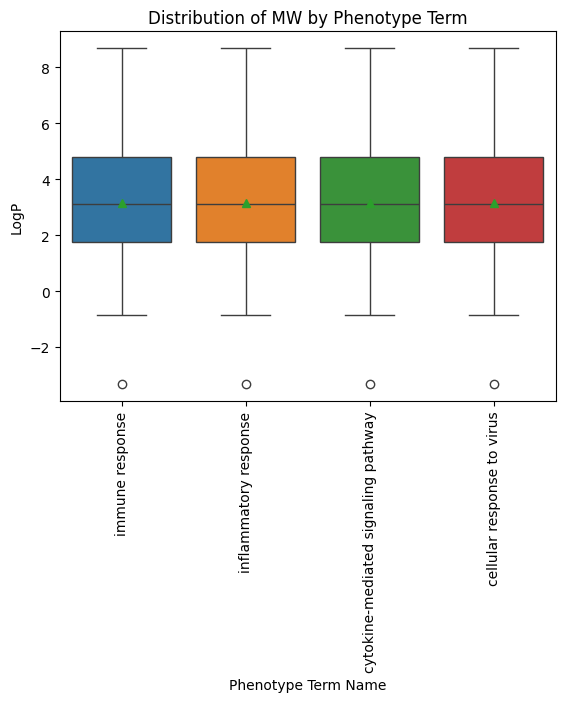

In [ ]:
# Create a boxplot with a hue variable based on the phenotype class
sns.boxplot(
    x = "Phenotype Term Name",
    y = "LogP",  # Replace with other Lipinski parameter (LogP, HBA, HBD)
    hue = "Phenotype Term Name",
    showmeans=True,  # Show mean as a point on the plot
    data=data_plot
)

# Customize the plot (optional)
plt.title("Distribution of MW by Phenotype Term")
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.show()

# Repeat for other Lipinski parameters by changing the 'y' variable


<ipython-input-35-65e31a5c2f35>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Phenotype Term Name', y='MW', data=data_plot, ax=axs[0, 0], palette=palette, showmeans=True).set_title('Molecular Weight')
<ipython-input-35-65e31a5c2f35>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Phenotype Term Name', y='LogP', data=data_plot, ax=axs[0, 1], palette=palette, showmeans=True).set_title('LogP')
<ipython-input-35-65e31a5c2f35>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Phenotype Term Name', y='HBA', data=data_plot, ax=axs[1,

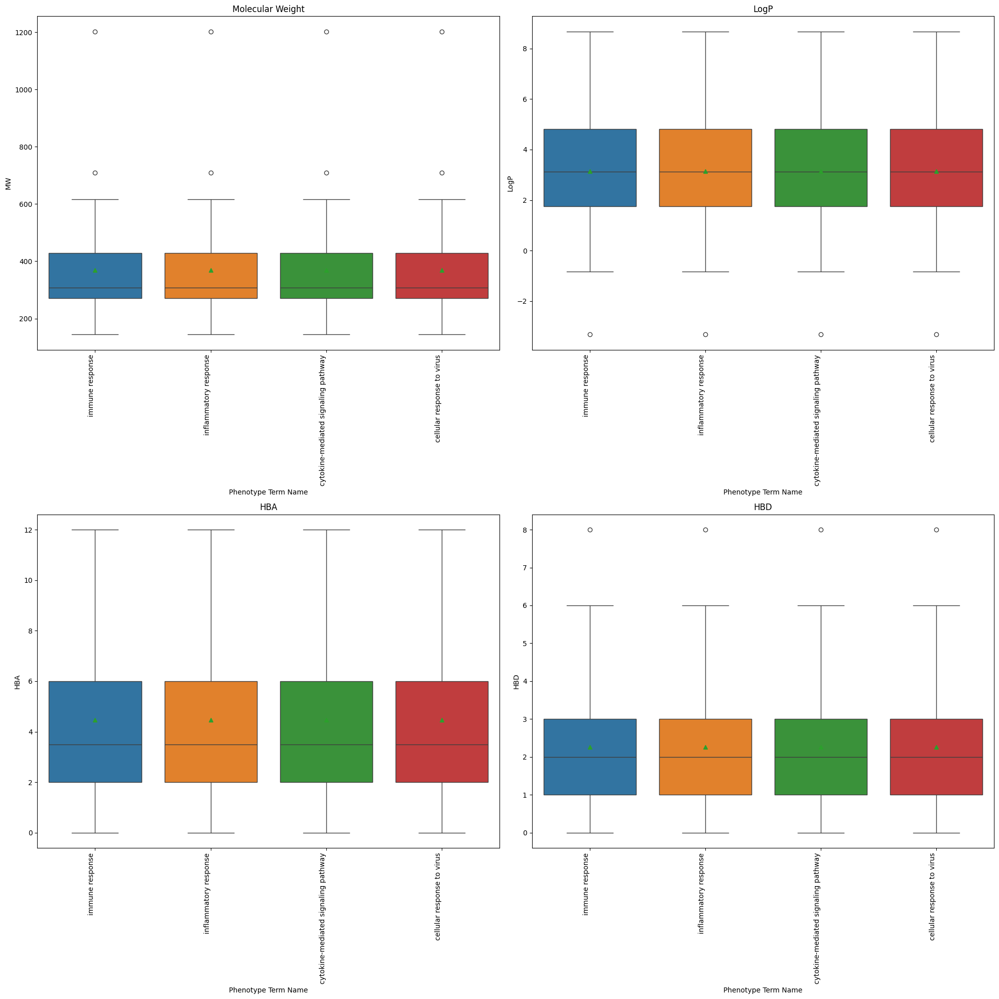

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Read data from CSV
data_plot = pd.read_csv("./CSA Analysis Lipinsky Filtered.csv")

# Define a color palette for different phenotypes
palette = sns.color_palette("tab10", len(data_plot['Phenotype Term Name'].unique()))  # Change 'tab10' to any other palette you prefer

# Create a boxplot for each Lipinski parameter across different phenotypes
fig, axs = plt.subplots(2, 2, figsize=(20, 20))
sns.boxplot(x='Phenotype Term Name', y='MW', data=data_plot, ax=axs[0, 0], palette=palette, showmeans=True).set_title('Molecular Weight')
sns.boxplot(x='Phenotype Term Name', y='LogP', data=data_plot, ax=axs[0, 1], palette=palette, showmeans=True).set_title('LogP')
sns.boxplot(x='Phenotype Term Name', y='HBA', data=data_plot, ax=axs[1, 0], palette=palette, showmeans=True).set_title('HBA')
sns.boxplot(x='Phenotype Term Name', y='HBD', data=data_plot, ax=axs[1, 1], palette=palette, showmeans=True).set_title('HBD')

# Rotate x-axis labels for better readability
for ax in axs.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right')

# Adjust the layout to prevent overlap of titles
plt.tight_layout()
plt.show()


### STEP 6.4.3 MOLECULAR FINGERPRINT ANALYSIS USING PUBCHEM AND SUBSTRUCTURE VALUES AGAINST THE EXPRESSED PHENOTYPES

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'merged_data.csv' is the merged dataset containing descriptors and phenotype terms
merged_data = pd.read_csv('/content/merged_data_CSA_new.csv')
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 980 entries, 0 to 979
Data columns (total 63 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Chemical Name        980 non-null    object 
 1   PubchemFP192         980 non-null    int64  
 2   PubchemFP20          980 non-null    int64  
 3   PubchemFP346         980 non-null    int64  
 4   PubchemFP356         980 non-null    int64  
 5   PubchemFP366         980 non-null    int64  
 6   PubchemFP381         980 non-null    int64  
 7   PubchemFP382         980 non-null    int64  
 8   PubchemFP420         980 non-null    int64  
 9   PubchemFP443         980 non-null    int64  
 10  PubchemFP498         980 non-null    int64  
 11  PubchemFP535         980 non-null    int64  
 12  PubchemFP541         980 non-null    int64  
 13  PubchemFP542         980 non-null    int64  
 14  PubchemFP548         980 non-null    int64  
 15  PubchemFP573         980 non-null    int

Chemical Name           object
PubchemFP192             int64
PubchemFP20              int64
PubchemFP346             int64
PubchemFP356             int64
                        ...   
SubFPC5                float64
SubFPC84               float64
SubFPC88               float64
SubFPC9                float64
Phenotype Term Name     object
Length: 63, dtype: object


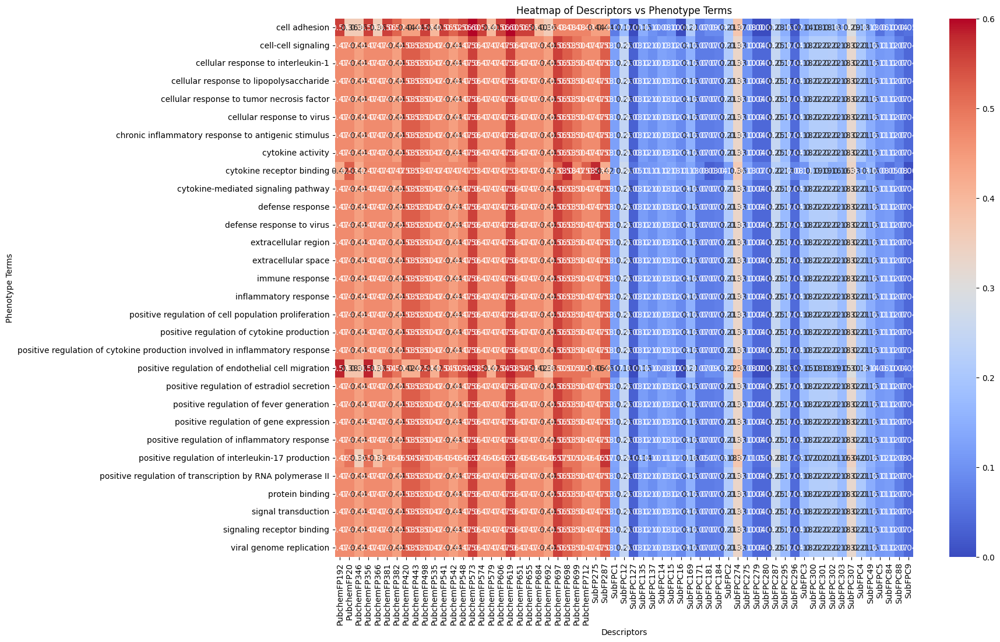

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'merged_data.csv' is the merged dataset containing descriptors and phenotype terms
merged_data = pd.read_csv('/content/merged_data_CSA_new.csv')

# Replace '#VALUE!' with 0 in all columns except 'Chemical Name' and 'Phenotype Term Name'
cols_to_convert = merged_data.columns.drop(['Chemical Name', 'Phenotype Term Name'])
merged_data[cols_to_convert] = merged_data[cols_to_convert].replace('#VALUE!', 0)

# Convert columns to numeric, setting errors to 'coerce' to handle non-numeric values
merged_data[cols_to_convert] = merged_data[cols_to_convert].apply(pd.to_numeric, errors='coerce')

# Check the data types after conversion
print(merged_data.dtypes)

# Create a heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(merged_data[cols_to_convert].join(merged_data['Phenotype Term Name']).groupby('Phenotype Term Name').mean(), cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Heatmap of Descriptors vs Phenotype Terms')
plt.xlabel('Descriptors')
plt.ylabel('Phenotype Terms')
plt.show()


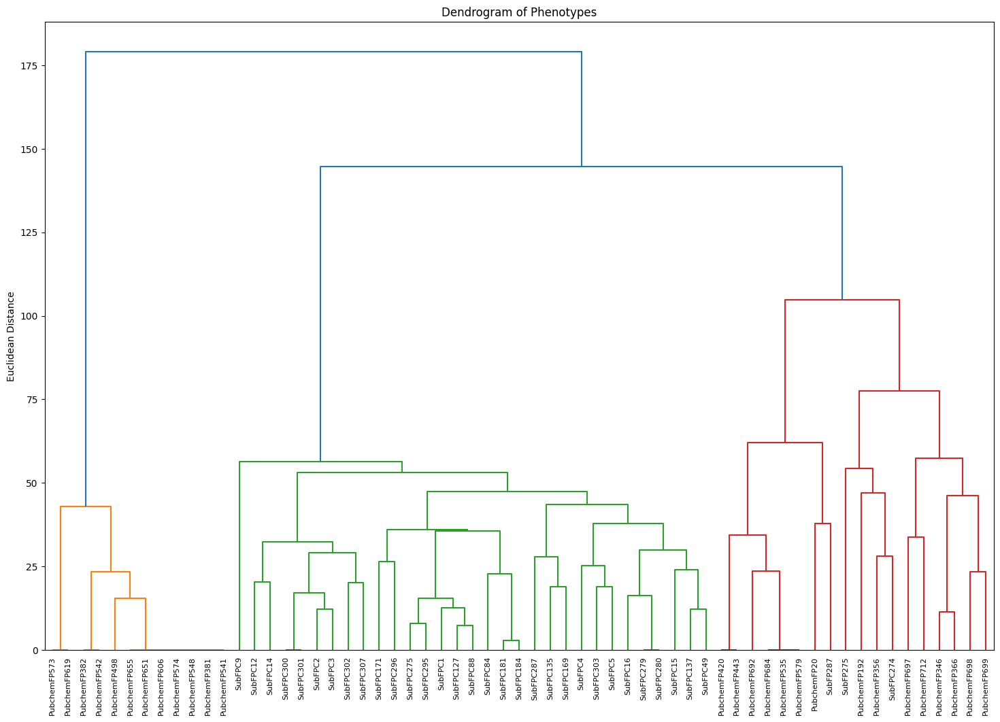

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from scipy.cluster import hierarchy

# Load the dataset
merged_data = pd.read_csv('/content/merged_data_CSA_new.csv')

# Drop non-descriptor columns
descriptor_columns = merged_data.columns.drop(['Chemical Name', 'Phenotype Term Name'])
descriptor_data = merged_data[descriptor_columns]

# Transpose the dataframe so that each row represents a phenotype
descriptor_data_transposed = descriptor_data.T

# Convert columns to numeric, setting errors to 'coerce' to handle non-numeric values
descriptor_data_transposed = descriptor_data_transposed.apply(pd.to_numeric, errors='coerce')

# Impute missing values with the mean
imputer = SimpleImputer(strategy='mean')
descriptor_data_transposed = imputer.fit_transform(descriptor_data_transposed)

# Standardize the data
scaler = StandardScaler()
descriptor_data_transposed = scaler.fit_transform(descriptor_data_transposed)

# Create a condensed distance matrix
dist = hierarchy.distance.pdist(descriptor_data_transposed, metric='euclidean')

# Perform hierarchical clustering
clustering = hierarchy.linkage(dist, method='ward')

# Plot the dendrogram
plt.figure(figsize=(18, 12))
hierarchy.dendrogram(clustering, labels=descriptor_columns, leaf_rotation=90, leaf_font_size=8)
plt.ylabel('Euclidean Distance')
plt.title('Dendrogram of Phenotypes')
plt.show()


<Figure size 50000x20000 with 0 Axes>

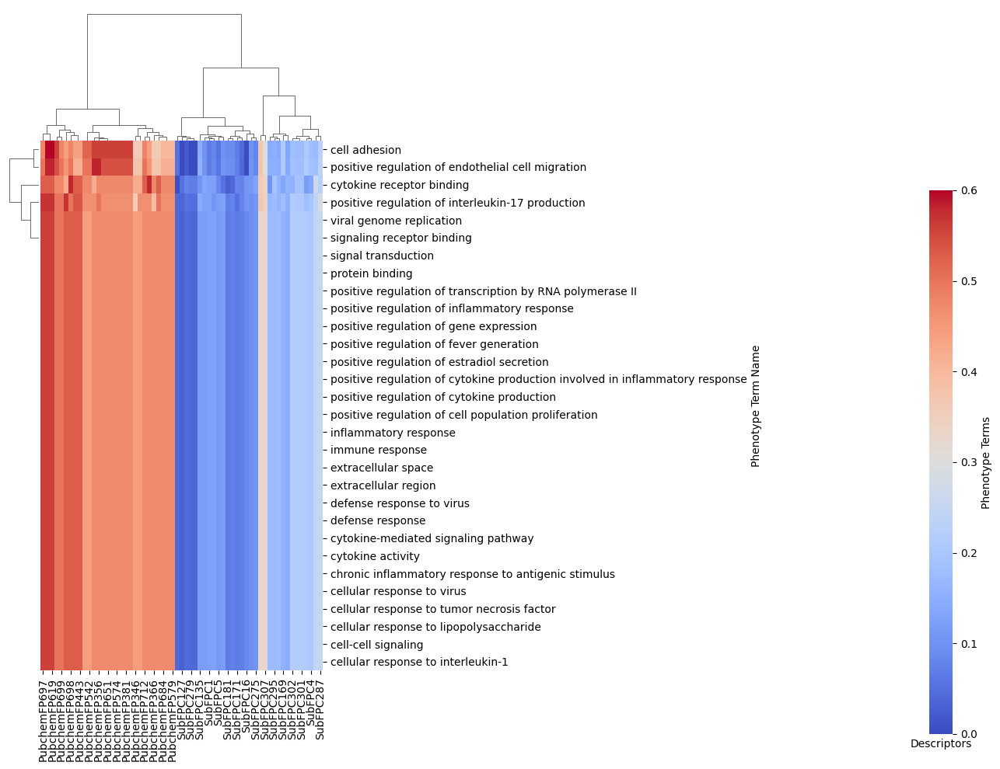

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_selection import VarianceThreshold

# Assuming 'merged_data.csv' is the merged dataset containing descriptors and phenotype terms
merged_data = pd.read_csv('/content/merged_data_CSA.csv')

# Replace '#VALUE!' with 0 in all columns except 'Chemical Name' and 'Phenotype Term Name'
cols_to_convert = merged_data.columns.drop(['Chemical Name', 'Phenotype Term Name'])
merged_data[cols_to_convert] = merged_data[cols_to_convert].replace('#VALUE!', 0)

# Convert columns to numeric, setting errors to 'coerce' to handle non-numeric values
merged_data[cols_to_convert] = merged_data[cols_to_convert].apply(pd.to_numeric, errors='coerce')

# Use VarianceThreshold to remove features with low variance
selector = VarianceThreshold(threshold=0.02)
selected_features = selector.fit_transform(merged_data[cols_to_convert])

# Get the columns selected by VarianceThreshold
selected_columns = merged_data[cols_to_convert].columns[selector.get_support()]

# Create a new DataFrame with selected features and phenotype term name
selected_data = pd.DataFrame(selected_features, columns=selected_columns)
selected_data['Phenotype Term Name'] = merged_data['Phenotype Term Name']

# Create a clustermap with dendrograms
plt.figure(figsize=(500, 200))
clustermap = sns.clustermap(
    selected_data.groupby('Phenotype Term Name').mean(),
    cmap='coolwarm',
    method='complete',  # Choose the clustering method (complete, single, average, ward)
    metric='euclidean',  # Choose the distance metric (euclidean, cityblock, cosine, etc.)
    row_cluster=True,  # Cluster rows
    col_cluster=True,  # Cluster columns
    dendrogram_ratio=(.1, .2),  # Adjust the size of the dendrogram
    cbar_pos=(1.2, 0.05, 0.03, 0.7)  # Adjust the position of the colorbar
)
# Reduce the font size of x-axis labels
clustermap.ax_heatmap.set_xticklabels(clustermap.ax_heatmap.get_xmajorticklabels(), fontsize=10)
plt.xlabel('Descriptors')
plt.ylabel('Phenotype Terms')
plt.show()


<Figure size 5000x4000 with 0 Axes>

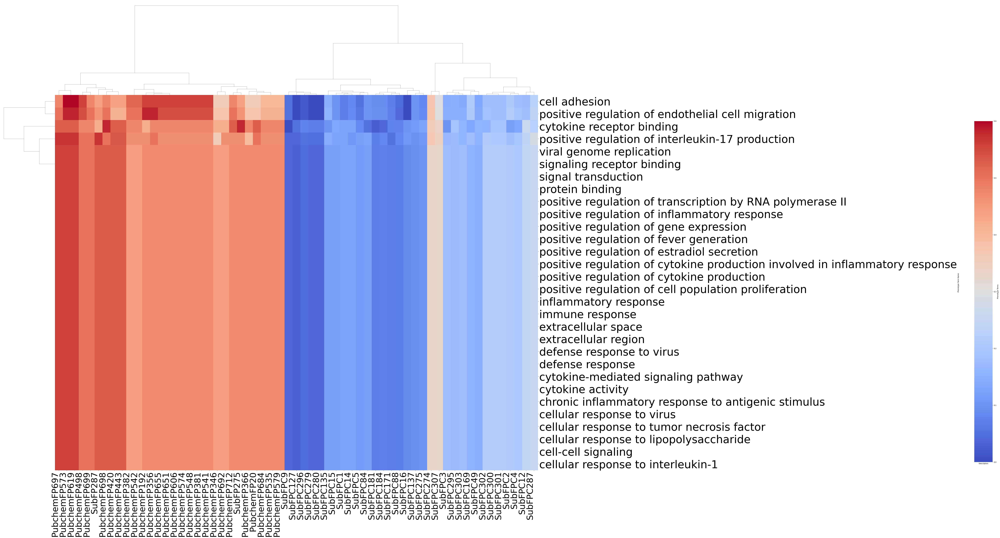

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_selection import VarianceThreshold

# Assuming 'merged_data.csv' is the merged dataset containing descriptors and phenotype terms
merged_data = pd.read_csv('/content/merged_data_CSA.csv')

# Replace '#VALUE!' with 0 in all columns except 'Chemical Name' and 'Phenotype Term Name'
cols_to_convert = merged_data.columns.drop(['Chemical Name', 'Phenotype Term Name'])
merged_data[cols_to_convert] = merged_data[cols_to_convert].replace('#VALUE!', 0)

# Convert columns to numeric, setting errors to 'coerce' to handle non-numeric values
merged_data[cols_to_convert] = merged_data[cols_to_convert].apply(pd.to_numeric, errors='coerce')

# Use VarianceThreshold to remove features with low variance
selector = VarianceThreshold(threshold=0.02)
selected_features = selector.fit_transform(merged_data[cols_to_convert])

# Get the columns selected by VarianceThreshold
selected_columns = merged_data[cols_to_convert].columns[selector.get_support()]

# Create a new DataFrame with selected features and phenotype term name
selected_data = pd.DataFrame(selected_features, columns=selected_columns)
selected_data['Phenotype Term Name'] = merged_data['Phenotype Term Name']

# Create a clustermap with dendrograms
plt.figure(figsize=(50, 40))  # Increase the figure size to make cells wider
clustermap = sns.clustermap(
    selected_data.groupby('Phenotype Term Name').mean(),
    cmap='coolwarm',
    method='complete',  # Choose the clustering method (complete, single, average, ward)
    metric='euclidean',  # Choose the distance metric (euclidean, cityblock, cosine, etc.)
    row_cluster=True,  # Cluster rows
    col_cluster=True,  # Cluster columns
    dendrogram_ratio=(.1, .2),  # Adjust the size of the dendrogram
    cbar_pos=(1.6, 0.05, 0.03, 0.7),  # Adjust the position of the colorbar
    figsize=(50, 40)  # Set the clustermap figure size directly
)

# Adjust the spacing for the clustermap heatmap to make it wider
clustermap.fig.set_size_inches(50, 40)

# Customize dendrogram lines
# Customize dendrogram lines
for ax in (clustermap.ax_row_dendrogram, clustermap.ax_col_dendrogram):
    for line in ax.get_lines():
        line.set_color('red')  # Set dendrogram lines color to black
        line.set_linewidth(5)  # Increase linewidth for better visibility

clustermap.ax_heatmap.set_xticklabels(
    clustermap.ax_heatmap.get_xmajorticklabels(),
    fontsize=50,
    rotation=90,
    ha='right'
)
clustermap.ax_heatmap.set_yticklabels(
    clustermap.ax_heatmap.get_ymajorticklabels(),
    fontsize=64
)

plt.xlabel('Descriptors')
plt.ylabel('Phenotype Terms')
plt.show()


## STEP 6.5 MERGING CHEMICALS , PHENOTYPES , PATHWAYS , GENES

In [ ]:
# Read pathway and chemicals  CSV files into DataFrames
chemical_gene_df = pd.read_csv('./Best Chemicals Processed.csv')
phenotype_gene_df = pd.read_csv('./Best Phenotypes Processed.csv')
pathways_gene_df = pd.read_csv('./Best Pathways Processed.csv')

# Merge the first two DataFrames based on the 'Gene Names' column
merged_df_full = pd.merge(chemical_gene_df, pathways_gene_df, on='Gene Names', how='inner')

# Merge the result with the third DataFrame based on the 'Gene Names' column
merged_df_full = pd.merge(merged_df_full, phenotype_gene_df, on='Gene Names', how='inner')


# Display the merged DataFrame
print(merged_df_full)

         Unnamed: 0_x     Chemical Name Gene Names  Unnamed: 0_y  \
0                   0    Benzo(a)pyrene       CCL2             0   
1                   0    Benzo(a)pyrene       CCL2            14   
2                   0    Benzo(a)pyrene       CCL2            27   
3                   0    Benzo(a)pyrene       CCL2            40   
4                   0    Benzo(a)pyrene       CCL2            53   
...               ...               ...        ...           ...   
1249631         13236      trans-phytol        IL2           108   
1249632         13236      trans-phytol        IL2           108   
1249633         12037    2-nitrotoluene        IL7           115   
1249634         12397  Interferon-alpha        IL7           115   
1249635         13039  methyl carbamate        IL7           115   

                                   Pathway Name  Unnamed: 0  \
0                                 Immune System         194   
1           Cytokine Signaling in Immune system         1

In [ ]:
merged_df_full.columns

Index(['Unnamed: 0_x', 'Chemical Name', 'Gene Names', 'Unnamed: 0_y',
       'Pathway Name', 'Unnamed: 0', 'Phenotype Term Name'],
      dtype='object')

In [ ]:
phenotype_chemicals_pathways_gene_merged = merged_df_full[['Chemical Name','Gene Names' , 'Pathway Name' , 'Phenotype Term Name']]
phenotype_chemicals_pathways_gene_merged.head()

,Chemical Name,Gene Names,Pathway Name,Phenotype Term Name
0,Benzo(a)pyrene,CCL2,Immune System,viral genome replication
1,Benzo(a)pyrene,CCL2,Cytokine Signaling in Immune system,viral genome replication
2,Benzo(a)pyrene,CCL2,Cytokine-cytokine receptor interaction,viral genome replication
3,Benzo(a)pyrene,CCL2,Signaling by Interleukins,viral genome replication
4,Benzo(a)pyrene,CCL2,Interleukin-10 signaling,viral genome replication


In [ ]:
phenotype_chemicals_pathways_gene_merged.to_csv('Phenotype_Chemical_Pathway_Merged.csv')

## STEP 7 JACCHARD INDEX (JI)
---
The Jaccard similarity score is calculated based on the number of shared elements between two sets, divided by the total number of unique elements in the sets. In the context of your pathway and phenotype data, the calculation can be broken down as follows:

1. **Intersection**: Find the number of genes that are common between the pathway and phenotype for each pair of pathway and phenotype.

2. **Union**: Find the total number of unique genes in both the pathway and phenotype for each pair.

3. **Jaccard Similarity**: Calculate the Jaccard similarity score for each pair as the intersection divided by the union.

Mathematically, the Jaccard similarity score `J(A, B)` between sets `A` and `B` is defined as:

J(A,B)=
∣A∪B∣ /
∣A∩B∣
​


where `|A|` represents the number of elements in set `A`, and `|A ∩ B|` represents the number of elements common to both sets `A` and `B`.


In [ ]:
## 1. Creating JI for pathways data on genes as reference

import pandas as pd

# Read the CSV file into a DataFrame
data = pd.read_csv('./Best Pathways Processed.csv')

# Group the data by Gene Names and aggregate the Pathways Term Names into sets
grouped_data = data.groupby('Gene Names')['Pathway Name'].agg(set)

# Create an empty DataFrame to store the Jaccard index matrix
genes = list(grouped_data.keys())
jaccard_matrix = pd.DataFrame(index=genes, columns=genes)

# Calculate the Jaccard index for each pair of genes and fill the matrix
for gene1 in genes:
    for gene2 in genes:
        if gene1 != gene2:
            pathways1 = grouped_data[gene1]
            pathways2 = grouped_data[gene2]
            intersection = len(pathways1.intersection(pathways2))
            union = len(pathways1.union(pathways2))
            jaccard_index = intersection / union
            jaccard_matrix.loc[gene1, gene2] = jaccard_index

# Fill the diagonal with 1, as the Jaccard index of a gene with itself is always 1
jaccard_matrix = jaccard_matrix.fillna(1.0)

# Save the Jaccard index matrix to a CSV file
jaccard_matrix.to_csv('Jaccard_Matrix_Pathways.csv')

In [ ]:
## 2. Creating JI for phenotypes data on genes as reference

import pandas as pd

# Read the CSV file into a DataFrame
data = pd.read_csv('./Best Phenotypes Processed.csv')

# Group the data by Gene Names and aggregate the Pathways Term Names into sets
grouped_data = data.groupby('Gene Names')['Phenotype Term Name'].agg(set)

# Create an empty DataFrame to store the Jaccard index matrix
genes = list(grouped_data.keys())
jaccard_matrix = pd.DataFrame(index=genes, columns=genes)

# Calculate the Jaccard index for each pair of genes and fill the matrix
for gene1 in genes:
    for gene2 in genes:
        if gene1 != gene2:
            phenotype1 = grouped_data[gene1]
            phenotype2 = grouped_data[gene2]
            intersection = len(phenotype1.intersection(phenotype2))
            union = len(phenotype1.union(phenotype2))
            jaccard_index = intersection / union
            jaccard_matrix.loc[gene1, gene2] = jaccard_index

# Fill the diagonal with 1, as the Jaccard index of a gene with itself is always 1
jaccard_matrix = jaccard_matrix.fillna(1.0)

# Save the Jaccard index matrix to a CSV file
jaccard_matrix.to_csv('Jaccard_Matrix_Phenotypes.csv')

In [ ]:
## 3. Creating JI for chemicals data on genes as reference

import pandas as pd

# Read the CSV file into a DataFrame
data = pd.read_csv('./Best Chemicals Processed.csv')

# Group the data by Gene Names and aggregate the Pathways Term Names into sets
grouped_data = data.groupby('Gene Names')['Chemical Name'].agg(set)

# Create an empty DataFrame to store the Jaccard index matrix
genes = list(grouped_data.keys())
jaccard_matrix = pd.DataFrame(index=genes, columns=genes)

# Calculate the Jaccard index for each pair of genes and fill the matrix
for gene1 in genes:
    for gene2 in genes:
        if gene1 != gene2:
            chemical1 = grouped_data[gene1]
            chemical2 = grouped_data[gene2]
            intersection = len(chemical1.intersection(chemical2))
            union = len(chemical1.union(chemical2))
            jaccard_index = intersection / union
            jaccard_matrix.loc[gene1, gene2] = jaccard_index

# Fill the diagonal with 1, as the Jaccard index of a gene with itself is always 1
jaccard_matrix = jaccard_matrix.fillna(1.0)

# Save the Jaccard index matrix to a CSV file
jaccard_matrix.to_csv('Jaccard_Matrix_Chemicals.csv')

## STEP 8 - ANALYSING JI MATRIX USING GRAPHICAL HEATMAP AND CLUSTERS

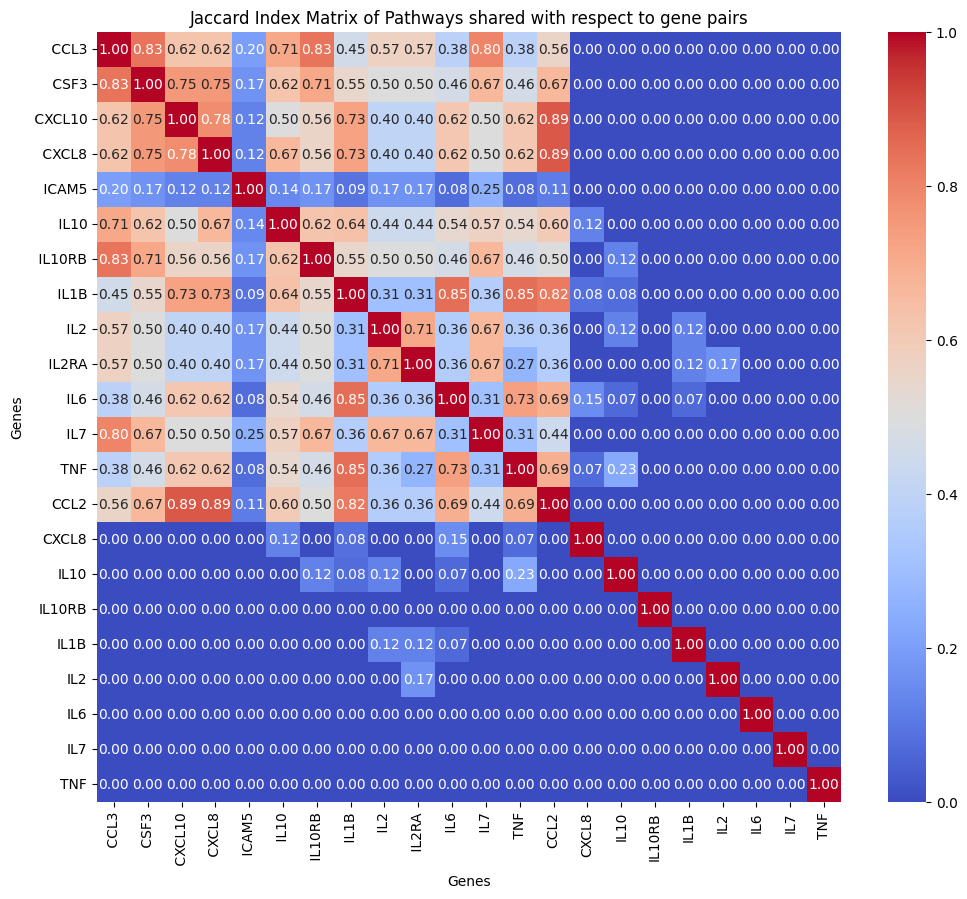

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Read the Jaccard index matrix from the CSV file into a DataFrame
jaccard_matrix_pathways = pd.read_csv('Jaccard_Matrix_Pathways.csv', index_col=0)

# Create a seaborn heatmap from the Jaccard index matrix
plt.figure(figsize=(12, 10))
sns.heatmap(jaccard_matrix_pathways, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Jaccard Index Matrix of Pathways shared with respect to gene pairs')
plt.xlabel('Genes')
plt.ylabel('Genes')
plt.show()

# Save the heatmap as an image with 600 DPI
plt.savefig('jaccard_heatmap_pathways.png', dpi=600)
plt.show()

<Figure size 1200x1000 with 0 Axes>

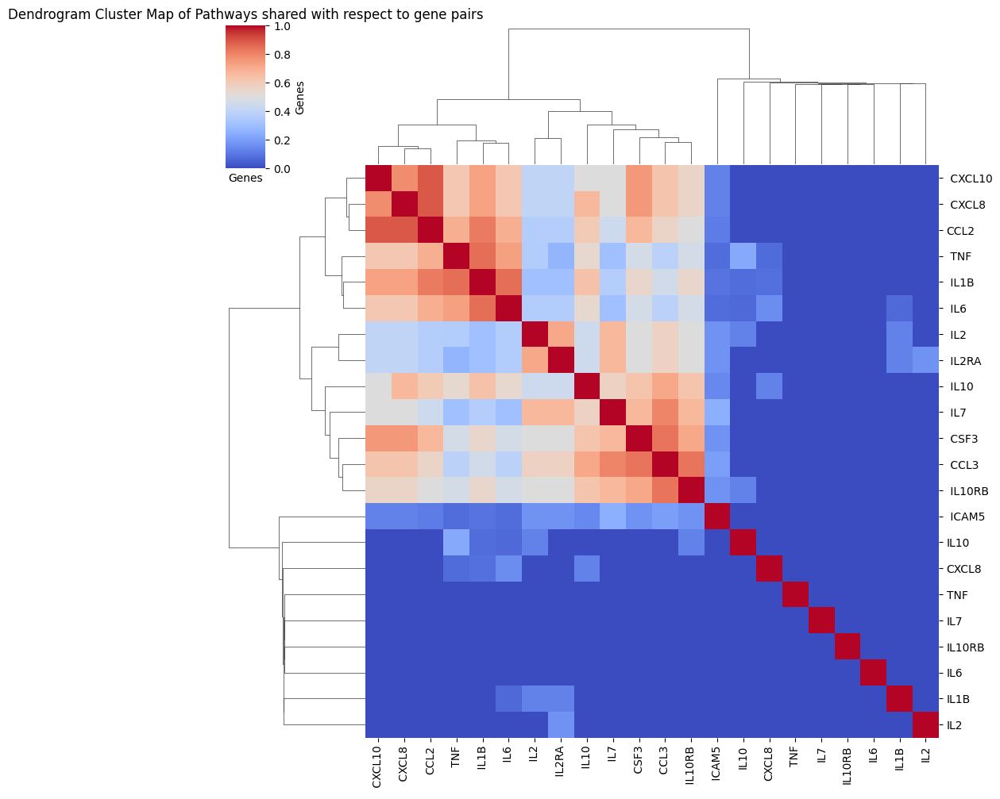

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster import hierarchy

# Read the Jaccard index matrix from the CSV file into a DataFrame
jaccard_matrix_pathways = pd.read_csv('Jaccard_Matrix_Pathways.csv', index_col=0)

# Calculate the linkage matrix for hierarchical clustering
linkage_matrix = hierarchy.linkage(jaccard_matrix_pathways, method='average')

# Create a dendrogram cluster map
plt.figure(figsize=(12, 10))
sns.clustermap(jaccard_matrix_pathways, row_linkage=linkage_matrix, col_linkage=linkage_matrix, cmap='coolwarm')
plt.title('Dendrogram Cluster Map of Pathways shared with respect to gene pairs')
plt.xlabel('Genes')
plt.ylabel('Genes')
plt.show()

# Save the dendrogram cluster map as an image with 600 DPI
plt.savefig('dendrogram_cluster_map_pathways.png', dpi=600)
plt.show()


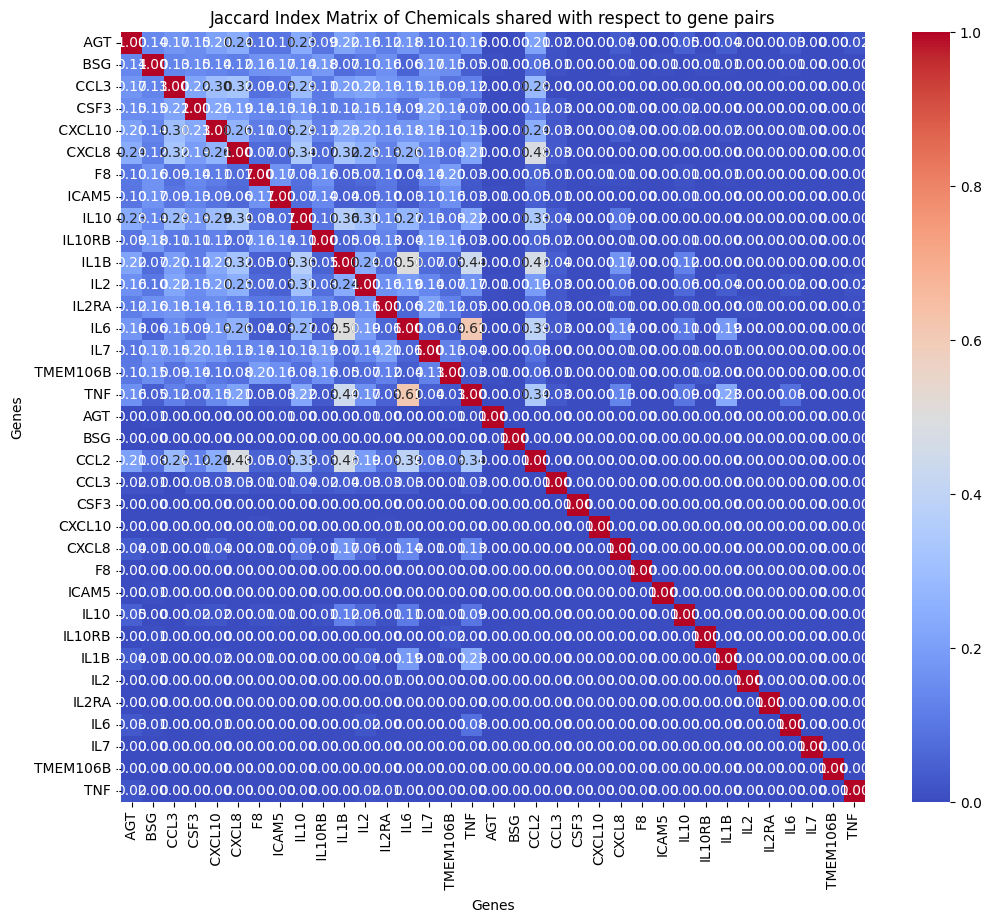

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Read the Jaccard index matrix from the CSV file into a DataFrame
jaccard_matrix_chemicals = pd.read_csv('Jaccard_Matrix_Chemicals.csv', index_col=0)

# Create a seaborn heatmap from the Jaccard index matrix
plt.figure(figsize=(12, 10))
sns.heatmap(jaccard_matrix_chemicals, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Jaccard Index Matrix of Chemicals shared with respect to gene pairs')
plt.xlabel('Genes')
plt.ylabel('Genes')
plt.show()

# Save the heatmap as an image with 600 DPI
plt.savefig('jaccard_heatmap_chemicals.png', dpi=600)
plt.show()

<Figure size 2000x2000 with 0 Axes>

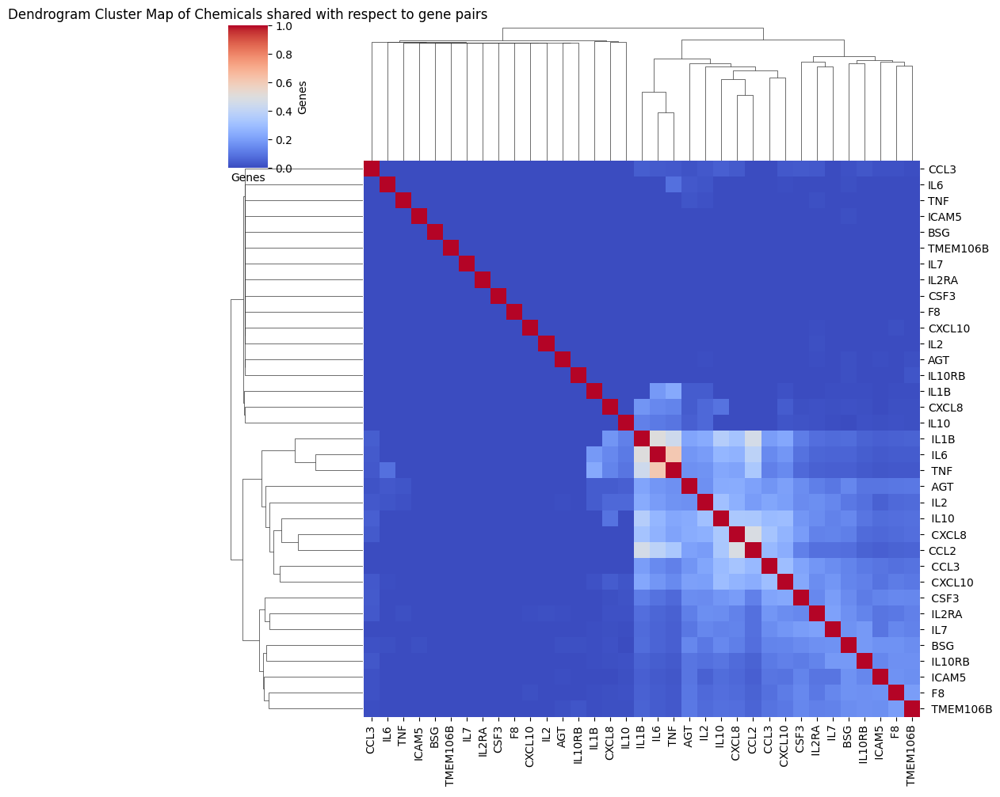

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster import hierarchy

# Read the Jaccard index matrix from the CSV file into a DataFrame
jaccard_matrix_chemicals = pd.read_csv('Jaccard_Matrix_Chemicals.csv', index_col=0)

# Calculate the linkage matrix for hierarchical clustering
linkage_matrix = hierarchy.linkage(jaccard_matrix_chemicals, method='average')

# Create a dendrogram cluster map
plt.figure(figsize=(20, 20))
sns.clustermap(jaccard_matrix_chemicals, row_linkage=linkage_matrix, col_linkage=linkage_matrix, cmap='coolwarm')
plt.title('Dendrogram Cluster Map of Chemicals shared with respect to gene pairs')
plt.xlabel('Genes')
plt.ylabel('Genes')
plt.show()

# Save the dendrogram cluster map as an image with 600 DPI
plt.savefig('dendrogram_cluster_map_chemicals.png', dpi=600)
plt.show()

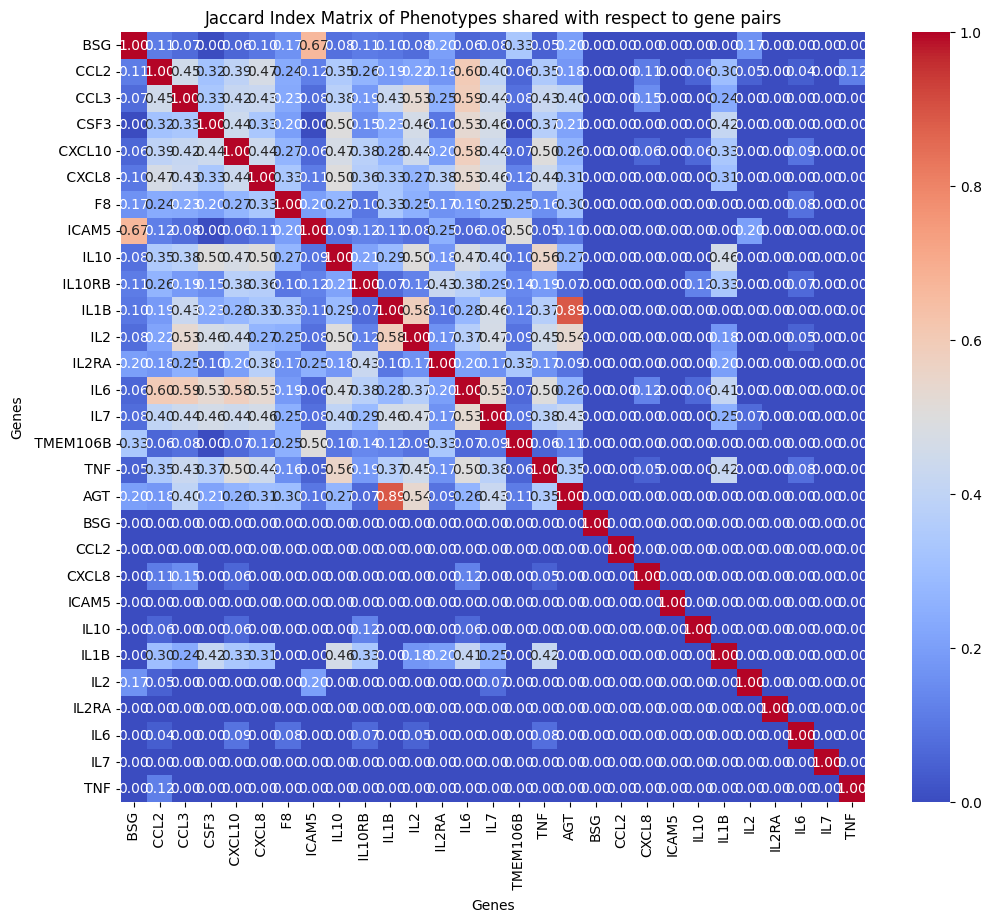

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Read the Jaccard index matrix from the CSV file into a DataFrame
jaccard_matrix_phenotypes = pd.read_csv('Jaccard_Matrix_Phenotypes.csv', index_col=0)

# Create a seaborn heatmap from the Jaccard index matrix
plt.figure(figsize=(12, 10))
sns.heatmap(jaccard_matrix_phenotypes, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Jaccard Index Matrix of Phenotypes shared with respect to gene pairs')
plt.xlabel('Genes')
plt.ylabel('Genes')
plt.show()

# Save the heatmap as an image with 600 DPI
plt.savefig('jaccard_heatmap_phenotypes.png', dpi=600)
plt.show()

<Figure size 5000x5000 with 0 Axes>

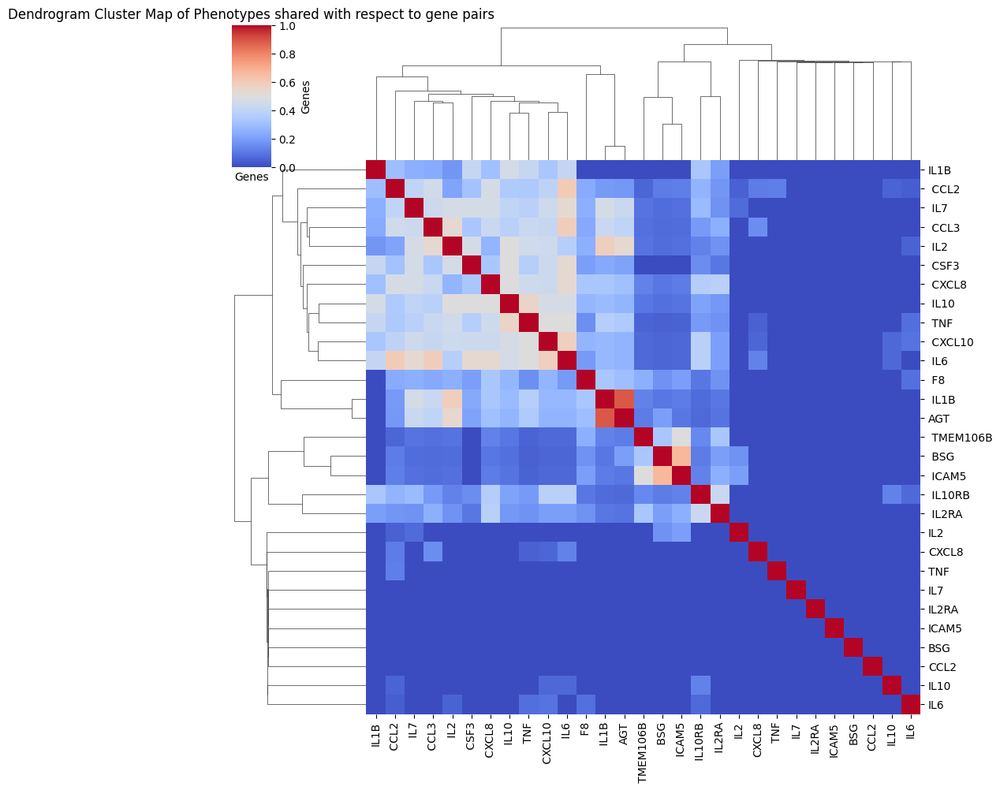

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster import hierarchy

# Read the Jaccard index matrix from the CSV file into a DataFrame
jaccard_matrix_phenotypes = pd.read_csv('Jaccard_Matrix_Phenotypes.csv', index_col=0)

# Calculate the linkage matrix for hierarchical clustering
linkage_matrix = hierarchy.linkage(jaccard_matrix_phenotypes, method='average')

# Create a dendrogram cluster map
plt.figure(figsize=(50, 50))
sns.clustermap(jaccard_matrix_phenotypes, row_linkage=linkage_matrix, col_linkage=linkage_matrix, cmap='coolwarm')
plt.title('Dendrogram Cluster Map of Phenotypes shared with respect to gene pairs')
plt.xlabel('Genes')
plt.ylabel('Genes')
plt.show()

# Save the dendrogram cluster map as an image with 600 DPI
plt.savefig('dendrogram_cluster_map_phenotypes.png', dpi=600)
plt.show()

## STEP 9 BUILDING COMPLEX BIOLOGICAL NETWORKS USING NETWORK X - MULTI NODE NETWORKS

In [ ]:
! pip install networkx[default]

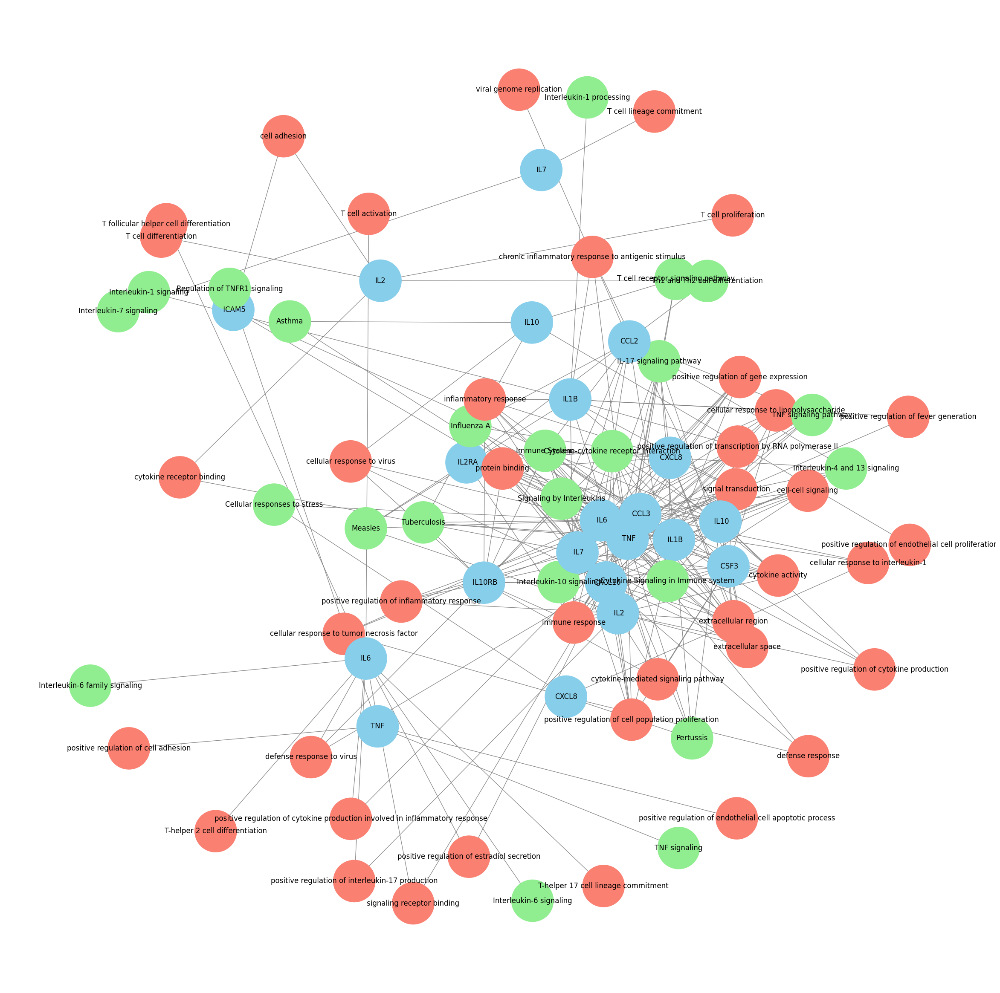

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Read the CSV file into a DataFrame
df = pd.read_csv('./Phenotype_Pathway_Gene.csv')

# Initialize a graph class
G = nx.Graph()

# Add nodes for chemicals, genes, and pathways using set theory to give unique values to initialise node objects
nodes = set(df['Pathway Name']).union(set(df['Gene Names'])).union(set(df['Phenotype Term Name']))
G.add_nodes_from(nodes)

# Define colors for different types of nodes
node_colors = {}
for node in nodes:
    if node in set(df['Gene Names']):
        node_colors[node] = 'skyblue'  # Color for Gene Names
    elif node in set(df['Pathway Name']):
        node_colors[node] = 'lightgreen'  # Color for Pathway Names
    elif node in set(df['Phenotype Term Name']):
        node_colors[node] = 'salmon'  # Color for Phenotype Names

# Add edges
for _, row in df.iterrows():
    G.add_edge(row['Pathway Name'], row['Gene Names'])
    G.add_edge(row['Gene Names'], row['Phenotype Term Name'])

# Draw the network with a modified spring layout
plt.figure(figsize=(30, 30))
pos = nx.spring_layout(G, k=2.6, iterations=200)  # Adjust k to increase node separation
nx.draw_networkx_nodes(G, pos, node_color=[node_colors[node] for node in G.nodes()], node_size=5000)
nx.draw_networkx_edges(G, pos, edge_color='gray', width=1.0, alpha=0.9)
nx.draw_networkx_labels(G, pos, font_size=12, font_family='sans-serif')
plt.axis('off')
plt.show()


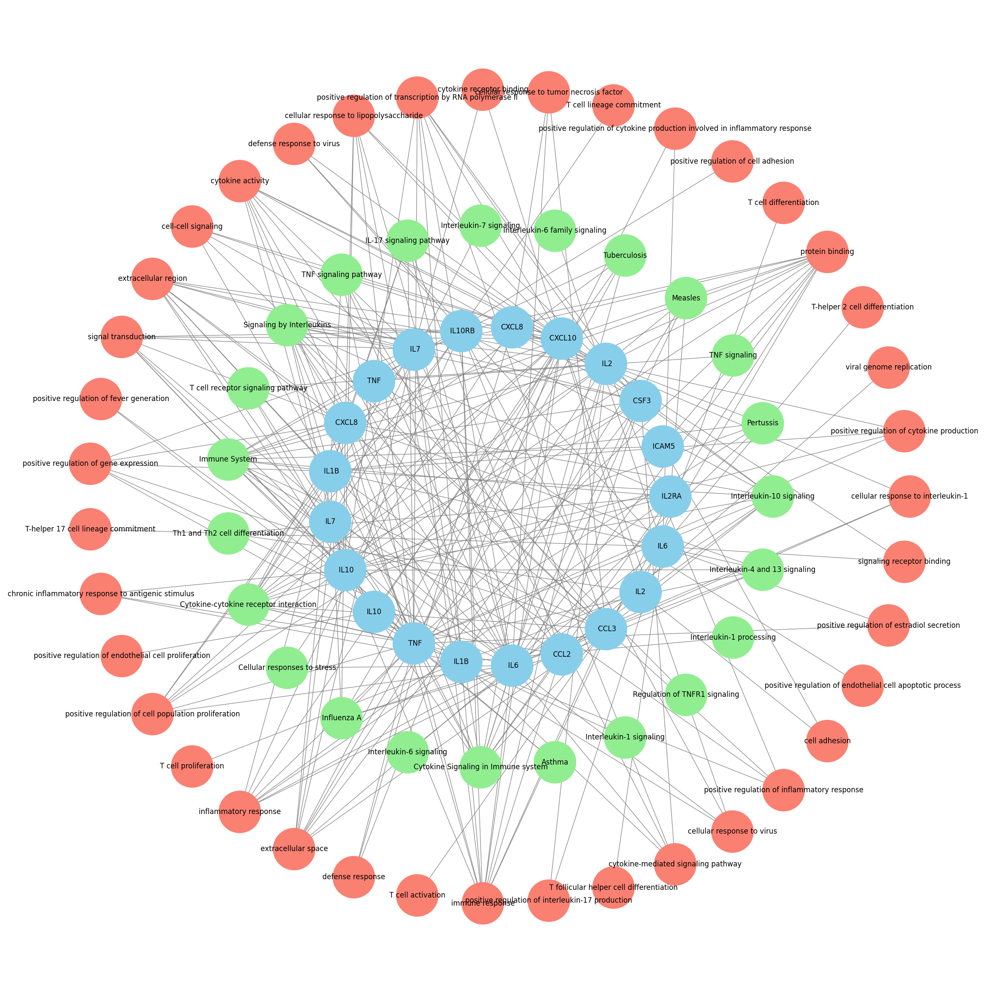

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Read the CSV file into a DataFrame
df = pd.read_csv('./Phenotype_Pathway_Gene.csv')

# Initialize a graph class
G = nx.Graph()

# Add nodes for genes, pathways, and phenotypes
genes = set(df['Gene Names'])
pathways = set(df['Pathway Name'])
phenotypes = set(df['Phenotype Term Name'])

# Add nodes to the graph
G.add_nodes_from(genes)
G.add_nodes_from(pathways)
G.add_nodes_from(phenotypes)

# Define colors for different types of nodes
node_colors = {}
for node in genes:
    node_colors[node] = 'skyblue'
for node in pathways:
    node_colors[node] = 'lightgreen'
for node in phenotypes:
    node_colors[node] = 'salmon'

# Add edges
for _, row in df.iterrows():
    G.add_edge(row['Pathway Name'], row['Gene Names'])
    G.add_edge(row['Gene Names'], row['Phenotype Term Name'])

# Function to calculate circular positions
def circular_layout(nodes, center, radius):
    angle_step = 2 * np.pi / len(nodes)
    positions = {}
    for i, node in enumerate(nodes):
        angle = i * angle_step
        x = center[0] + radius * np.cos(angle)
        y = center[1] + radius * np.sin(angle)
        positions[node] = (x, y)
    return positions

# Set positions for each layer with increased radii for more space
pos = {}
center = (0, 0)
pos.update(circular_layout(genes, center, radius=5))
pos.update(circular_layout(pathways, center, radius=8))
pos.update(circular_layout(phenotypes, center, radius=12))

# Draw the network with increased node separation
plt.figure(figsize=(30, 30))
nx.draw_networkx_nodes(G, pos, node_color=[node_colors[node] for node in G.nodes()], node_size=5000)
nx.draw_networkx_edges(G, pos, edge_color='gray', width=1.0, alpha=0.9)
nx.draw_networkx_labels(G, pos, font_size=12, font_family='sans-serif')
plt.axis('off')
plt.show()


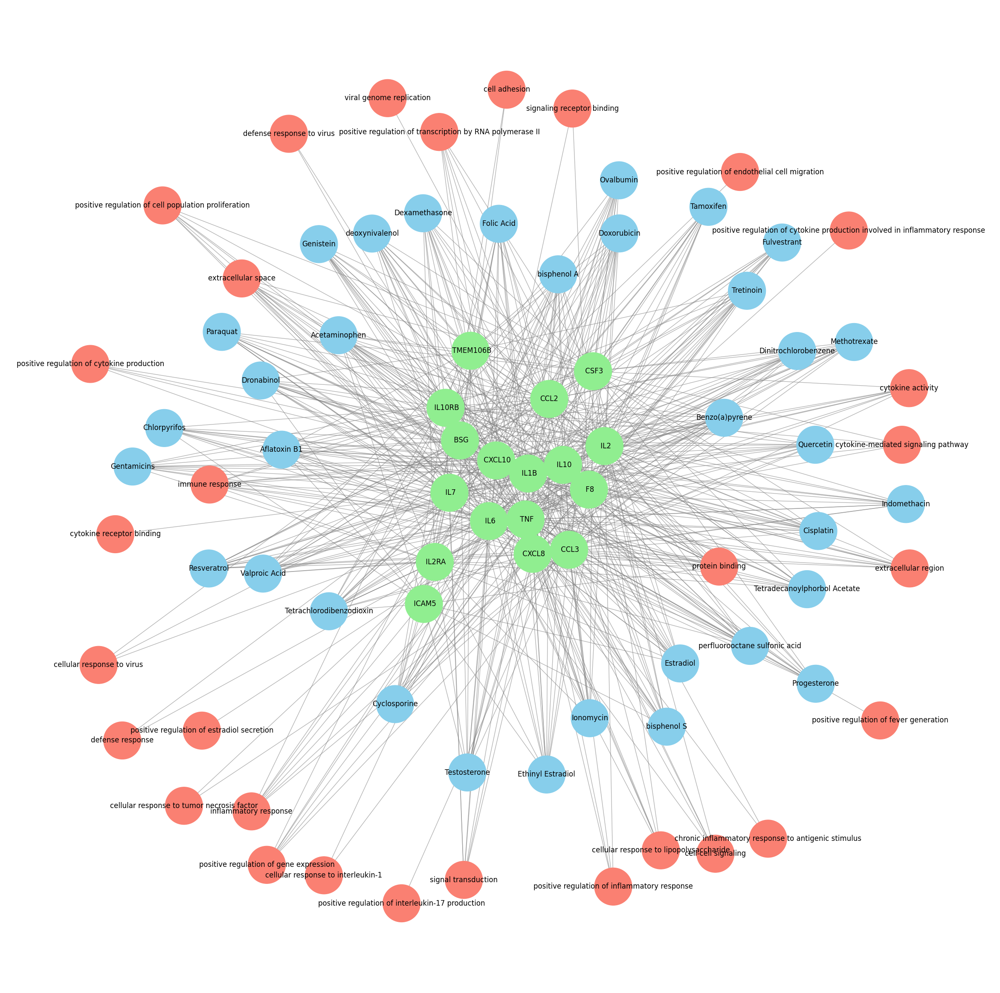

In [ ]:

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Read the CSV file into a DataFrame
df = pd.read_csv('/content/Screened_Chemicals_Phenotypes_Genes.csv')

# Initialize a graph class
G = nx.Graph()

# Add nodes for chemicals, genes, and pathways using set theory to give unique values to initialise node objects
nodes = set(df['Chemical Name']).union(set(df['Gene Names'])).union(set(df['Phenotype Term Name']))
G.add_nodes_from(nodes)

# Define colors for different types of nodes
node_colors = {}
for node in nodes:
    if node in set(df['Chemical Name']):
        node_colors[node] = 'skyblue'  # Color for Gene Names
    elif node in set(df['Gene Names']):
        node_colors[node] = 'lightgreen'  # Color for Pathway Names
    elif node in set(df['Phenotype Term Name']):
        node_colors[node] = 'salmon'  # Color for Phenotype Names

# Add edges
for _, row in df.iterrows():
    G.add_edge(row['Chemical Name'], row['Gene Names'])
    G.add_edge(row['Gene Names'], row['Phenotype Term Name'])

# Draw the network with a modified spring layout
plt.figure(figsize=(30, 30))
pos = nx.spring_layout(G, k=1.5, iterations=50)  # Adjust k to increase node separation
nx.draw_networkx_nodes(G, pos, node_color=[node_colors[node] for node in G.nodes()], node_size=4000)
nx.draw_networkx_edges(G, pos, edge_color='gray', width=1.0, alpha=0.6)
nx.draw_networkx_labels(G, pos, font_size=12, font_family='sans-serif')
plt.axis('off')
plt.show()

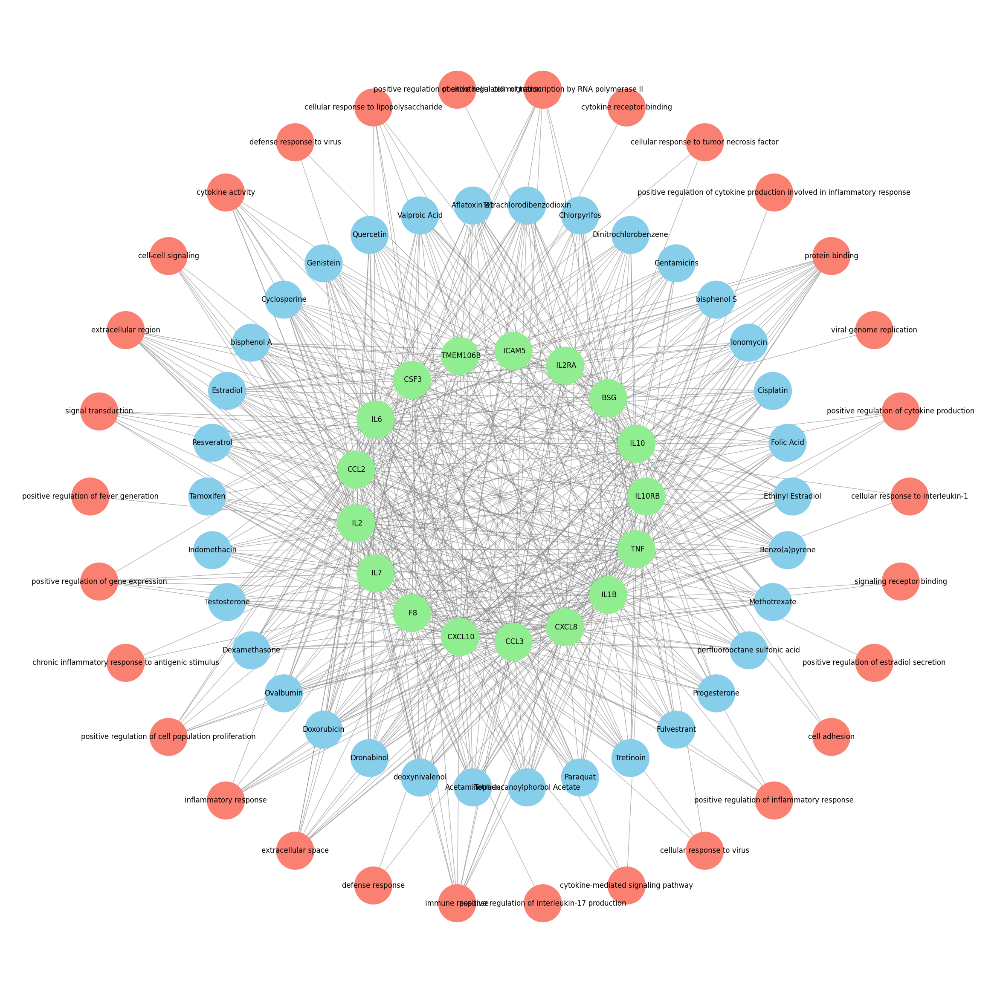

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Read the CSV file into a DataFrame
df = pd.read_csv('/content/Screened_Chemicals_Phenotypes_Genes.csv')

# Initialize a graph class
G = nx.Graph()

# Add nodes for chemicals, genes, and phenotypes
chemicals = set(df['Chemical Name'])
genes = set(df['Gene Names'])
phenotypes = set(df['Phenotype Term Name'])

# Add nodes to the graph
G.add_nodes_from(chemicals)
G.add_nodes_from(genes)
G.add_nodes_from(phenotypes)

# Define colors for different types of nodes
node_colors = {}
for node in chemicals:
    node_colors[node] = 'skyblue'  # Color for Chemical Names
for node in genes:
    node_colors[node] = 'lightgreen'  # Color for Gene Names
for node in phenotypes:
    node_colors[node] = 'salmon'  # Color for Phenotype Names

# Add edges
for _, row in df.iterrows():
    G.add_edge(row['Chemical Name'], row['Gene Names'])
    G.add_edge(row['Gene Names'], row['Phenotype Term Name'])

# Function to calculate circular positions
def circular_layout(nodes, center, radius):
    angle_step = 2 * np.pi / len(nodes)
    positions = {}
    for i, node in enumerate(nodes):
        angle = i * angle_step
        x = center[0] + radius * np.cos(angle)
        y = center[1] + radius * np.sin(angle)
        positions[node] = (x, y)
    return positions

# Set positions for each layer with increased radii for more space
pos = {}
center = (0, 0)
pos.update(circular_layout(chemicals, center, radius=10))
pos.update(circular_layout(genes, center, radius=5))
pos.update(circular_layout(phenotypes, center, radius=14))

# Draw the network with increased node separation
plt.figure(figsize=(30, 30))
nx.draw_networkx_nodes(G, pos, node_color=[node_colors[node] for node in G.nodes()], node_size=4000)
nx.draw_networkx_edges(G, pos, edge_color='gray', width=1.0, alpha=0.6)
nx.draw_networkx_labels(G, pos, font_size=12, font_family='sans-serif')
plt.axis('off')
plt.show()
